Rain in Australia
===

![Rain in Australia 2008 to 2009](https://drive.google.com/uc?id=1jeVAK1A6OcNi-bz8ha4_NFbWVXGMJ7Zw)


<small>*Figura 1: Datos meterológicos de Australia del 2008 al 2009, obtenidos de http://www.bom.gov.au/climate/history/enso/*</small>


*Datos del proyecto:*

| Subtitulo   | Trabajo final de Análisis de Datos - FIUBA                                                                                                     |
| ----------- | ---------------------------------------------------------------------------------------------------------------------------------------------- |
| **Descrpción**  | Análisis de datos meteorológicos de Australia con el objetivo de predecir si lloverá al otro día                          |
| **Integrantes** | • Juan Cruz Ferreyra (ferreyra.juancruz95@gmail.com)<br>• Simón Rodriguez (simon.andre.r@gmail.com)<br>• Bruno Masoller (brunomaso1@gmail.com)<br>• David Canal (jose.david.canal.89@gmail.com) |

## 1. Metodología

En el campo de aprendizaje de máquina, la comunidad todavía está definiendo un proceso sistemático y estructurado para el cliclo de vida de soluciones basadas en aprendizaje automático. El objetivo es enfocar los procedimientos y estándares de calidad de la ingeniería de software clásica a metodologías de este sub-campo de la inteligencia artificial.

Es en este punto que surge [CRISP-ML(Q)](https://arxiv.org/pdf/2003.05155.pdf), como una metodología que integra las mejores prácticas de la ingeniería de software sobre todo el ciclo de vida de soluciones enfocadas en resolver problemas con aprendizaje de máquina.

CRISP-ML(Q) surge a partir de [CRISP-DM](https://es.wikipedia.org/wiki/Cross_Industry_Standard_Process_for_Data_Mining) como un intento de ampliar dicho "framework" al área de "machine learning".

En palabras de los autores (Stefan Studer et al),  CRISP-ML(Q) propone un modelo de proceso al que llaman modelo de proceso estándar "CRoss-Industry" para el desarrollo de aplicaciones de "Machine Learning" con metodología de aseguramiento de la Calidad, donde resalta su compatibilidad con CRISP-DM. Está diseñado para el desarrollo de aplicaciones de máquina, es decir, escenarios de aplicaciones donde se implementa y mantiene un modelo de ML
como parte de un producto o servicio.

Consta de seis fases:
1. Business and Data Understanding
2. Data Engineering (Data Preparation)
3. Machine Learning Model Engineering (Modeling)
4. Quality Assurance for Machine Learning Applications
5. Deployment
6. Monitoring and Maintenance.

![Figura 2: Machine Learning Development Life Cycle Process](https://drive.google.com/uc?id=1Aoiu62mQCrICj34T6eTHFRJLfmsXxkfS)



<small>*Figura 2: Machine Learning Development Life Cycle Process, obtenido de https://ml-ops.org/content/crisp-ml*</small>

En donde cada fase requiere el siguiente proceso:

![Figura 3: Proceso dentro de cada fase](https://drive.google.com/uc?id=1rsbfC0Ry_6ZFAbxFhYVFC1M9r87Rm1xr)

<small>*Figura 3: Proceso dentro de cada fase, obtenido de https://ml-ops.org/content/crisp-ml*</small>

Resumen de tareas de cada fase:
*También se agrega infromación adiccional. Toada esta tabla se puede tomar como una especie de "checklist".*

| CRISP-ML(Q) Phase                | Tasks                                                                                                                                                                             |
| -------------------------------- | --------------------------------------------------------------------------------------------------------------------------------------------------------------------------------- |
| *Business and Data Understanding*  | • Define the Scope of the ML Application<br>• Sucess criteria<br>• Feasibility<br>• Data collection<br>• Data quality verification<br>• Review of output documents                |
| *Data Engineering*                 | • Select data<br>• Clean data<br>• Construct data<br>• Standarize data                                                                                                            |
| *ML Model Engineering*             | • Modeling<br>• Assure reproducibility                                                                                                                                            |
| *ML Model Evaluation*              | • Validate performance<br>• Determine robustness<br>•Increase explainability for ML practitioner and end user<br>• Compare results with defined success criteria                  |
| *Model Deployment*                 | • Define inference hardware<br>• Model evaluation under production<br>• Assure user acceptance and usability<br>• Minimize the risks of unforseen errors<br>• Deployment strategy |
| *Model Monitoring and Maintenance* | • Monitor<br>• Update                                                                                                                                                             |

<small>*Tabla 1: Fases y tareas de CRISP-ML(Q)*</small>

Un ejemplo de algunos de los modelos más utilizados se puede observar en la siguiente imagen:

![Figura 3: Machine learning models example](https://drive.google.com/uc?id=18iOgYZI3Z5PZqhseZA5ADEmUPn9NcHZ-)

<small>*Figura 3: Ejemplo de modelos de aprendizaje automático, obtenido de https://www.researchgate.net/publication/369194767_A_Different_Traditional_Approach_for_Automatic_Comparative_Machine_Learning_in_Multimodality_Covid-19_Severity_Recognition*</small>

## 2. CRISP-ML(Q)

> *Notas sobre la aplicación del Método*: Dada la acotación planteada para el trabajo, no se tienen en cuenta todas las fases (solamente aquellas que son acotadas a los temas vistos en el curso), ni tampoco el análisis de riesgo que plantea el modelo dentro de cada fase. Se plantean como mejoras posteriores.

In [ ]:
from IPython import display

# Instalaciones de paquetes del SO
!apt-get -qq install -y libspatialindex-dev

# Instalacion de paquetes de python
!pip install gdown
!pip install ydata-profiling
!pip install -q -U osmnx

display.clear_output()

In [ ]:
import json
import os
import random
import re  # Expresiones regulares
import sys  # Interactuar con el sistema
from itertools import chain, combinations  # Iteradores
from pathlib import Path

import geopandas as gpd  # Georeferenciacion
import matplotlib.pyplot as plt  # Visualización de datos
import numpy as np  # Albegra lineal
import osmnx as ox  # OpenStreetMap
import pandas as pd  # Procesamiento de datos
import scipy.stats as stats
import seaborn as sns  # Visualización de datos estadísticos
import sklearn
import statsmodels.api as sm  # Regresión lineal
from geopandas.datasets import get_path  # Ruta de los datos geográficos
from scipy.stats import chi2_contingency  # Test de chi-cuadrado
from shapely.geometry import Point  # Geometría espacial
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (accuracy_score,  # Metricas para evaluación
                             confusion_matrix, f1_score, precision_score,
                             recall_score)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from ydata_profiling import ProfileReport  # Reporte (profiling)

# Linea mágica para mostrar los graficos dentro del notebook
%matplotlib inline

In [ ]:
# Configuración del notebook
pd.options.mode.chained_assignment = None

debug_mode = False # Modo más informativo
show_profile = False # Muestra el perfilado de los datos
spectral_palette = [ "#9e0142", "#d53e4f", "#f46d43", "#fdae61", "#fee08b",
                    "#ffffbf", "#e6f598", "#abdda4", "#66c2a5", "#3288bd", "#5e4fa2"] # Paleta de colores
random_state = 42 # Semilla para reproducibilidad
graphs_types = {
    'pie': 'pie',
    'hist': 'hist',
    'bar': 'bar',
    'qq-plot': 'qq-plot',
    'box-plot': 'box-plot'
}

In [ ]:
### FUNCIONES AUXILIARES ###

def show_unique_types_as_df(df, columns):
    # Crear una lista para almacenar la información
    type_info = []

    for column in columns:
        if column in df.columns:
            types = df[column].apply(lambda x: type(x) if not pd.isna(x) else np.nan)
            unique_types = types.unique()
            for t in unique_types:
                type_info.append({
                    'Column': column,
                    'Type': 'NaN' if t is np.nan else str(t)
                })
        else:
            type_info.append({
                'Column': column,
                'Type': 'Not in DataFrame'
            })

    # Convertir la lista a un DataFrame
    type_info_df = pd.DataFrame(type_info)

    return type_info_df

# Definir una función personalizada para concatenar los valores
def concatenate_values(series):
    return ', '.join(series.astype(str))

# Muestra los tipos únicos de datos en las columnas especificadas de un DataFrame, incluyendo NaN.
def show_unique_types(df, columns):
    for column in columns:
        if column in df.columns:
            types = df[column].apply(lambda x: type(x) if not pd.isna(x) else np.nan)
            unique_types = types.unique()
            print(f"Columna '{column}' tiene los siguientes tipos únicos:")
            for t in unique_types:
                if t is np.nan:
                    print(f"  - NaN")
                else:
                    print(f"  - {t}")
        else:
            print(f"La columna '{column}' no está en el DataFrame")

# Imprimir los valores únicos de cada columna
def print_unique_values(unique_values):
  for col, values in unique_values.items():
      print(f"Columna: {col}")
      try:
        print(values.to_numpy())
      except:
        print(values)
      print()  # Imprimir una línea en blanco para separar las columna

# Muestra el porcentaje de valores faltantes.
def print_missing_perc(df, column):
    missing_perc = round((df[column].isna().sum() / df.shape[0]) * 100, 1)
    print(f"Porcentaje de valores faltantes en la columna {column}: {missing_perc}%")

# Evaluar las predicciones en una matriz de confuncion.
def evaluate_predictions(y_true, y_pred, figsize=(4, 4)):
    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Mapping of labels
    labels = ["No", "Yes"]

    # Plot confusion matrix
    plt.figure(figsize=figsize)
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Greens",
        xticklabels=labels,
        yticklabels=labels,
        cbar=False,
    )
    plt.xlabel("Predicted Values")
    plt.ylabel("Real Values")
    plt.title("Confusion Matrix")
    plt.show()

    # Calculate evaluation metrics
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)

    # Print evaluation metrics
    print()
    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")

def phi_coefficient(confusion_matrix):
    chi2, p, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    phi = np.sqrt(chi2 / n)
    return phi, p

# Función para graficar un pie plot.
def plot_pie(column, ax):
    counts = df[column].value_counts()
    labels = counts.index
    sizes = counts.values
    ax.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140)
    ax.set_title(column)

# Función para graficar un gráfico de barras
def plot_bar(column, ax):
    sns.countplot(data=df, x=column, ax=ax)
    ax.set_title(column)
    # Nota: Elimino las etiquetas en el eje de las x porque quedan muy apretadas
    ax.set_xlabel('')  # Eliminar la etiqueta del eje x
    ax.set_xticklabels([])  # Eliminar las etiquetas en el eje x

# Función para graficar un histograma.
def plot_hist(column, ax):
    sns.histplot(df[column], kde=True, ax=ax)
    ax.set_title(column)

# Función para graficar qq-plot
def plot_qq_plots(column, ax):
    sm.qqplot(df[column].dropna(), line ='45', fit=True, ax=ax)
    ax.set_title(f'QQ-plot for {column}')

# Funcion para graficar boxplot
def plot_boxplot(column, ax):
    sns.boxplot(df[column], ax=ax)
    ax.set_title(column)

def plot_graph_on_grid(df, columns, graph_type, num_cols=3):
    num_rows = (len(columns) + num_cols - 1) // num_cols  # cálculo del número de filas

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
    axes = axes.flatten()

    for i, col in enumerate(columns):
        if graph_type == graphs_types['pie']:
            plot_pie(col, axes[i])
        elif graph_type == graphs_types['hist']:
            plot_hist(col, axes[i])
        elif graph_type == graphs_types['bar']:
            plot_bar(col, axes[i])
        elif graph_type == graphs_types['qq-plot']:
            plot_qq_plots(col, axes[i])
        elif graph_type == graphs_types['box-plot']:
            plot_boxplot(col, axes[i])
        else:
            raise Exception(f'Tipo de gráfico no soportado. Los graficos soportados son: {str(graphs_types.keys())}')

    # Elimina cualquier gráfico extra en la grilla
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

### 2.1. Entendimiento del negocio y los datos (Business and Data Understanding)

> Debería tener en cuenta los siguientes puntos:
> - Define the Scope of the ML Application
>     - Business objetives
>         - Business description (business scenario)
>         - ML requirements
>         - Data constrains
>             - Security
>             - Availability
>         - Translate business objetives into ML objetives
>         - Type of analysis
>             - Descriptive analysis
>             - Diagnostic analysis
>             - Predictive analysis
>             - Prescriptive analysis
>         - Use ML Canvas (https://www.ownml.co/machine-learning-canvas)
> - Sucess criteria
>     - Mesurables requirements (check software engineering requirements specification)
>         - Correctness
>         - Completeness
>         - Consistency
>         - Unambiguosness
>         - Ranking for importance and stability
>         - Modificability
>         - Verificability
>         - Traceability
>         - Design independence
>         - Testability
>         - Undenstandable by the customer
>         - Right level ob abstraction
>     - Business sucess criteria
>     - ML sucess criteria
>         - Performance
>         - Robustness
>         - Scalability
>         - Explainability
>         - Model complexity
>         - Resource demand
>     - Economic sucess criteria
>     - Check also system quality atributes
> - Feasibility
>     - Availability, size and quality of the training set
>     - Applicability of ML technology
>     - Legal constraints
>     - Requirements on the application
> - Data collection
>     - Data version control
>     - Data generation process
> - Data quality verification
>     - Data description
>         - Data exploration with domain knownledge
>            - Data attributes and meaning
>            - Data types
>            - Momentums
>            - Missing values
>            - Outliers
>            - Correlation between data
>            - Data visualization
>         - Data requirements
>             - Missing values
>             - Outliers
>         - Data verification
>             - Avoid low quality data
> - Review of output documents
>     - Re-define tasks and risks

#### 2.1.1. Definir el alcance de la solución

Este proyecto se plantea en el marco de la materia Análisis de Datos de la especialización en Inteligencia Artifical de la Facultad de Ingeniería de la Universidad de Buenos Aries; por lo tanto, es un proyecto con fines académicos.

Como objetivo principal, se plantea lo siguiente:

<mark>El objetivo es predecir si lloverá o no al día siguiente (variable RainTomorrow), en función de los datos meterológicos del día actual.</mark>

En este caso, el conjunto a analizar corresponde a los datos meterológicos de Australia recolectados durante 10 años de varias ubicaciones.
Los datos fueron recolectados en base a observaciones diarias, por la oficina de meteorolgía de Australia (Bureau of Meteorology), los cuales están disponibles al público desde su página: http://www.bom.gov.au/

De los tipos de análisis vistos en el curso, este entra dentro del análisis predictivo, donde la pregunta es *¿Qué ocurrirá?*

#### 2.1.2. Criterios de éxito

Como criterio de éxito orientado al negocio, en este caso, dado que es un proyecto académico, se enfoca en interaccionar con todos los tópicos vistos en el curso. Dichos tópicos son:
- Análisis estadístico básico de los datos
- Caracterización de variables
- Imputación de datos faltantes
- Preparación de datos y validación de resultados
<!-- TODO: Completar con el resto de las herramientas y temas vistos en clase  -->

Como criterio de éxito orientado al modelo de aprendizaje, se propone obtener una presición mayor al 90%, donde el enfoque sea en reducir la tasa de falsos negativos, ya que en este caso es más el impacto del usuario para dichos escenarios, en donde es preferible llevar un paraguas y que no llueva, a que no llevar un paraguas y que llueva.

Como criterio de éxito orientado a lo económico, dado que es un proyecto académico, se plantea que el tiempo de dedicación se mantenga uniforme entre todos los integrantes del proyecto. Así como también completar el proyecto antes de una fecha límite.

#### 2.1.3. Factibilidad

Dado que ya existe un conjunto de datos (https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package/data), y que dichos datos provienen de una buena fuente como lo es la oficina de meterología de Australia (también es un conjunto ámpliamente usado y calificado en "kaggle"), se considera factible los objetivos planteados.

In [ ]:
# Descargamos el dataset
!gdown 1hEBhDvdBoXwNQPt-EpzYen6V2CzMK0cY

Downloading...
From: https://drive.google.com/uc?id=1hEBhDvdBoXwNQPt-EpzYen6V2CzMK0cY
To: /content/weatherAUS.csv
100% 14.1M/14.1M [00:00<00:00, 26.0MB/s]


In [ ]:
# Cargar el dataset

dataset_path = 'weatherAUS.csv'

try:
    df = pd.read_csv(dataset_path)
    print("Archivo cargado correctamente.")
except FileNotFoundError:
    print(f"Error: El archivo '{dataset_path}' no se encuentra.")
except Exception as e:
    print(f"Ocurrió un error al importar el archivo: {e}")

Archivo cargado correctamente.


In [ ]:
print('Tamaño del conjunto:', len(df))

Tamaño del conjunto: 145460


<p><em>
El tamaño del conjunto es de <code>145460</code>, por lo que no se identifican problemas de disponibilidad ni de tamaño de los datos.
</em><p>

#### 2.1.4. Recolección de datos

En este caso, el conjunto de datos ya fue recolectado y se descargaron de https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package/data, donde se brindan competencias sobre conjuntos determinados.

Los datos no fueron actualizados desde que se compartieron y no se pretende que se actualicen, por lo que no es necesario un sistema de control de versiones de los datos.

#### 2.1.5. Verificación la de calidad de los datos

##### 2.1.5.1. Exploración de los datos

Perfilado de los datos:

In [ ]:
profile = ProfileReport(df, title='Reporte') # Cargamos el reporte
if show_profile:
  profile.to_notebook_iframe() # Lo mostramos en pantalla (tiempo aproximado 5 minutos)

###### 2.1.5.1.1. Atributos y significados

> En este paso, se describen los atributos según el conocimiento del problema.

In [ ]:
# Mostramos los datos.
df.sample(10, random_state=random_state)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
100721,2012-04-22,MountGambier,15.0,18.9,4.2,6.6,8.0,NNW,54.0,NNW,...,73.0,64.0,1005.2,1003.7,4.0,5.0,17.3,17.6,Yes,Yes
30234,2008-03-30,Sydney,13.1,26.8,0.0,4.6,10.9,NaN,NaN,W,...,61.0,22.0,1013.0,1009.0,0.0,1.0,16.9,25.9,No,No
68427,2011-12-10,Melbourne,19.0,29.0,NaN,11.0,5.6,N,59.0,N,...,50.0,38.0,1006.5,1003.4,NaN,NaN,24.2,27.2,NaN,NaN
28624,2013-03-27,Richmond,18.1,32.2,0.0,2.1,NaN,NE,30.0,NaN,...,99.0,51.0,1019.2,1014.6,NaN,NaN,20.9,31.6,No,No
31173,2010-10-25,Sydney,13.9,19.6,14.0,1.2,5.4,SSW,50.0,SW,...,90.0,64.0,NaN,1018.4,7.0,6.0,15.5,19.1,Yes,No
573,2010-06-27,Albury,0.6,11.9,0.2,NaN,NaN,W,22.0,SW,...,99.0,54.0,1024.3,1021.8,1.0,2.0,2.8,11.5,No,No
120056,2015-11-22,PerthAirport,21.8,36.2,0.0,12.2,11.9,E,61.0,NNE,...,14.0,12.0,1014.9,1013.2,6.0,0.0,31.2,33.4,No,No
43057,2010-04-25,Wollongong,17.7,22.3,NaN,NaN,NaN,SSE,54.0,NaN,...,NaN,80.0,1012.8,1014.3,NaN,7.0,NaN,17.0,NaN,Yes
28966,2014-03-04,Richmond,18.4,25.7,2.6,1.2,NaN,NE,24.0,NaN,...,100.0,64.0,1026.5,1023.3,NaN,NaN,19.8,24.2,Yes,No
90691,2010-02-25,GoldCoast,22.0,27.9,16.6,NaN,NaN,SSE,61.0,SSE,...,77.0,78.0,1021.4,1020.9,NaN,NaN,25.3,23.8,Yes,Yes


<p><em>
Podemos observar que el dataset contiene 23 columnas, o sea 23 atributos. También algunos otros datos como que de por sí el conjunto tiene <code>NaN</code> como datos, lo que indica que probablemente sea más fácil cambiar estos datos a los análogos en <code>numpy</code>.
</em></p>

In [ ]:
print('Atributos:')
df.columns

Atributos:


Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

<p><em>
Según el conocimiento del negocio, tenemos la descripción de los siguientes atributos:

- `Date` → Tipo: Fecha (formato: `YYYY-MM-DD`) | Fecha de cuando se tomó la observación.
- `Location` → Tipo: Cualitativa-Nominal | Ubicación de la estación meterológica
- `MinTemp` → Tipo: Cuantitativa-Continua | Temperatura mínima (mínimo histórico de -23°)
- `MaxTemp` → Tipo: Cuantitativa-Continua | Temperatura máxima (máximo histórico de 51°)
- `Rainfall` → Tipo: Cuantitativa-Continua | Cuanta lluvia calló (máximo histórico en 375mm)
- `Evaporation` → Tipo: Cuantitativa-Continua | Cuanto fue la evaporación
- `Sunshine` → Tipo: Cuantitativa-Continua | Número de horas solares del día
- `WindGustDir` → Tipo: Cualitativa-Nominal | Dirección del viento más fuerte
- `WindGustSpeed` → Tipo: Cuantitativa-Continua | Velocidad del viento más fuerte (máximo registrado 408 km/h, en un cliclón, no se toman en cuenta tornados que vuela todo)
- `WindDir9am` → Tipo: Cualitativa-Nominal | Datos específicos según hora del día
- `WindDir3pm` → Tipo: Cualitativa-Nominal | Datos específicos según hora del día
- `WindSpeed9am` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `WindSpeed3pm` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `Humidity9am` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `Humidity3pm` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `Pressure9am` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `Pressure3pm` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `Cloud9am` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `Cloud3pm` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `Temp9am` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `Temp3pm` → Tipo: Cuantitativa-Continua | Datos específicos según hora del día
- `RainToday` → Tipo: Booleano | Indica si llovío en el día
- `RainTomorrow` → Tipo: Booleano | Indicador de riesgo si lloverá mañana o no. Es la variable objetivo.

De este análisis preliminar, podemos deducir las siguientes suposiciones:
- Podría haber una correlación entre la cantidad de lluvia y si llovió hoy. O sea, entre `Rainfall` y `RainToday`.
</em></p>

###### 2.1.5.1.2. Datos duplicados

In [ ]:
# Información básica de los datos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [ ]:
# Chequeamos si hay datos duplicados en las columnas Date y Location
df = df.sort_values(by=["Location", "Date"]).reset_index(drop=True)

is_any_duplicated = df.duplicated(subset=["Date", "Location"], keep=False).any()
print("Observaciones duplicadas para una fecha o localidad: ", is_any_duplicated)

Observaciones duplicadas para una fecha o localidad:  False


<p><em>
Encontramos que la mayoria de las columnas corresponden a variables cuantitativas. Podemos observar que cuatro de ellas poseen una gran proporción de valores nulos: <code>Evaporation</code>, <code>Sunshine</code>, <code>Cloud9am</code>, <code>Cloud3pm</code>. El resto de las variables numéricas poseen cerca del 10% de valores faltantes o menos.

Entre las variables de tipo cualitativas identificamos a <code>Location</code> y <code>Date</code> como columnas identificatorias de una observación, es decir, no hay filas con valores repetidos si tomamos el subset de esas dos columnas. Tampoco se observan valores nulos en niguna de ambas columnas. La importancia de estas variables no reside sólo en su carácter identificatorio, sino además proveen información, espacial y temporal, que vamos a procesar más adelante y que puede resultar útil para nuestro modelo.

Observamos además que, entre las variables de tipo cualitativa tenemos la variable target <code>RainTomorrow</code>, binaria por definición del problema a resolver, y la variable <code>RainToday</code> que, intuitivamente, sigue una misma codificación que la variable target mencionada. Es importante notar que ambas variables binarias cuentan con valores nulos en algunas observaciones.

Finalmente, encontramos tres variables cualitativas relacionadas con la dirección del viento en diferentes momentos del día. Podemos considerar a estas variables como categóricas ordinales en el sistema de coordenadas polares, no existiendo relación de menor-mayor entre ellas pero si una relación secuencial en dos dimensiones.
</em></p>

###### 2.1.5.1.X. Tipos de datos

> En este punto se investiga los tipos de datos y se asigna el tipo correcto según el caso.

<p><em>
Según lo analizado anteriormente, tenemos la siguiente clasificación de tipos de datos:
</em></p>


| **Variable**      | **Tipo actual** | **Tipo correcto** |
|-------------------|-----------------|-------------------|
| **Date**          | object          | datetime64        |
| **Location**      | object          | category          |
| **MinTemp**       | float64         | ✔                 |
| **MaxTemp**       | float64         | ✔                 |
| **Rainfall**      | float64         | ✔                 |
| **Evaporation**   | float64         | ✔                 |
| **Sunshine**      | float64         | ✔                 |
| **WindGustDir**   | object          | category          |
| **WindGustSpeed** | float64         | ✔                 |
| **WindDir9am**    | object          | category          |
| **WindDir3pm**    | object          | category          |
| **WindSpeed9am**  | float64         | ✔                 |
| **WindSpeed3pm**  | float64         | ✔                 |
| **Humidity9am**   | float64         | ✔                 |
| **Humidity3pm**   | float64         | ✔                 |
| **Pressure9am**   | float64         | ✔                 |
| **Pressure3pm**   | float64         | ✔                 |
| **Cloud9am**      | float64         | ✔                 |
| **Cloud3pm**      | float64         | ✔                 |
| **Temp9am**       | float64         | ✔                 |
| **Temp3pm**       | float64         | ✔                 |
| **RainToday**     | object          | bool              |
| **RainTomorrow**  | object          | bool              |

In [ ]:
# Se realizan las asignaciones de datos correspondientes
cat_columns = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']
bool_columns = ['RainToday', 'RainTomorrow']
date_columns = ['Date']

df[cat_columns] = df[cat_columns].astype('category')
df[date_columns] = df[date_columns].astype('datetime64[ns]')
mapping_dict = {"Yes" : 1, "No" : 0}
df[bool_columns] = df[bool_columns].applymap(lambda x: mapping_dict.get(x, x))

In [ ]:
# Finalmente agrego los tipos en estructuras separadas para facilitar el tratamiento
cat_columns += bool_columns
cont_columns = ['MinTemp','MaxTemp','Rainfall','Evaporation','Sunshine',
                   'WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am',
                   'Humidity3pm','Pressure9am','Pressure3pm','Cloud9am',
                   'Cloud3pm','Temp9am','Temp3pm']

Chequeamos que los valores faltantes tengan el tipo adecuado (también se arreglan valores que tienen incorrecto -basado en intución y conocimiento del negocio).

In [ ]:
# Para columnas categóricas, simplemente nos fijamos en los valores que toma
# Crear un diccionario para almacenar los valores únicos de cada columna categórica
unique_values = {col: df[col].unique() for col in cat_columns}
print_unique_values(unique_values)

Columna: Location
['Adelaide' 'Albany' 'Albury' 'AliceSprings' 'BadgerysCreek' 'Ballarat'
 'Bendigo' 'Brisbane' 'Cairns' 'Canberra' 'Cobar' 'CoffsHarbour'
 'Dartmoor' 'Darwin' 'GoldCoast' 'Hobart' 'Katherine' 'Launceston'
 'Melbourne' 'MelbourneAirport' 'Mildura' 'Moree' 'MountGambier'
 'MountGinini' 'Newcastle' 'Nhil' 'NorahHead' 'NorfolkIsland' 'Nuriootpa'
 'PearceRAAF' 'Penrith' 'Perth' 'PerthAirport' 'Portland' 'Richmond'
 'Sale' 'SalmonGums' 'Sydney' 'SydneyAirport' 'Townsville' 'Tuggeranong'
 'Uluru' 'WaggaWagga' 'Walpole' 'Watsonia' 'Williamtown' 'Witchcliffe'
 'Wollongong' 'Woomera']

Columna: WindGustDir
['NW' 'SW' 'W' 'NNE' 'N' 'NNW' 'WSW' 'WNW' 'SSE' 'ENE' 'SSW' nan 'ESE'
 'SE' 'NE' 'E' 'S']

Columna: WindDir9am
['SW' 'SSW' 'NNE' 'WNW' 'N' 'WSW' 'ENE' 'NE' 'W' 'S' nan 'ESE' 'NNW' 'SSE'
 'NW' 'E' 'SE']

Columna: WindDir3pm
['W' 'SW' 'NE' 'NNW' 'WSW' 'NW' 'N' 'ENE' 'S' 'SSW' 'NNE' nan 'WNW' 'E'
 'SSE' 'ESE' 'SE']

Columna: RainToday
[ 1.  0. nan]

Columna: RainTomorrow
[ 0. na

<p><em>
Podemos observar que los valores tienen adecuandamente el tipo <code>np.nan</code>

Para las columnas continuas, simplemente corroboramos que todas tegan el mismo tipo de datos.

In [ ]:
# Llamar a la función y guardar la información en un DataFrame
type_info_df = show_unique_types_as_df(df, cont_columns)
type_info_df = type_info_df.groupby('Column').agg({'Type': concatenate_values}).reset_index()
type_info_df

,Column,Type
0,Cloud3pm,"NaN, <class 'float'>"
1,Cloud9am,"NaN, <class 'float'>"
2,Evaporation,"<class 'float'>, NaN"
3,Humidity3pm,"<class 'float'>, NaN"
4,Humidity9am,"<class 'float'>, NaN"
5,MaxTemp,"<class 'float'>, NaN"
6,MinTemp,"<class 'float'>, NaN"
7,Pressure3pm,"<class 'float'>, NaN"
8,Pressure9am,"<class 'float'>, NaN"
9,Rainfall,"<class 'float'>, NaN"


<p><em>
Podemos corroborar que únicamente se encuentran tipos <code>float</code>. Nota: Los valores <code>NaN</code> en pandas son del tipo <code>float</code> y se representan como <code>numpy.float64</code>. Para diferenciarlos específicamente como <code>NaN</code>, podemos usar <code>numpy.isnan</code> para identificar estos valores y considerarlos por separado. Esto lo hacemos en la función y por esto se muestra este tipo a parte.
</em></p>

###### 2.1.5.1.3. Momentos

> En esta sección se analizan los momentos y datos estadísticos de las variables.

In [ ]:
# Datos estadísticos del conjunto
df.describe()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
count,145460,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000,142199.000000,142193.000000
mean,2013-04-04 21:08:51.907053568,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339,0.224193,0.224181
min,2007-11-01 00:00:00,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000,0.000000,0.000000
25%,2011-01-11 00:00:00,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000,0.000000,0.000000
50%,2013-06-02 00:00:00,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000,0.000000,0.000000
75%,2015-06-14 00:00:00,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000,0.000000,0.000000
max,2017-06-25 00:00:00,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000,1.000000,1.000000
std,NaN,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665,0.417051,0.417043


<p><em>
Dados los datos estadísticos de las variables continuas, podemos ver que los máximos y mínimos de las variables de temperatura son acordes con los datos históricos, así como la velocidad del viento. Otro punto a observar son que los máximos y mínimos de las presiones también están acordes con los datos de la presiona atmosférica promedio, medida en hecto-pascales.

Otro punto a destacar es que los máximos y mínimos no se alejan tanto de la media con excepción de algunos atributos como `Rainfall` que el máximo se aleja muchísimo más de la media (mucho más de tres desviaciones), siendo posibles casos de análisis de valores atípicos.
</em></p>


In [ ]:
# Valor más frecuente para variables categóricas
df[cat_columns].mode()

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,Canberra,W,N,SE,0.0,0.0


In [ ]:
# Creamos una grilla de gráficos de barras
plot_graph_on_grid(df, columns=cat_columns, num_cols=3, graph_type='bar')

<p><em>
Podemos observar que hay un gran desbalance de clases en la variable <code>RainToday</code> y en la variable objetivo <code>RainTomorrow</code>, en donde el porcentaje es el siguiente:
</em></p>

In [ ]:
# Creamos una grilla de graficos pie
plot_graph_on_grid(df, columns=['RainToday', 'RainTomorrow'], num_cols=2, graph_type='pie')

<p><em>
Este punto lo tenemos que tratar en otra sección: <strong>Clases desbalanceadas</strong>
</p></em>

Analizamos la oblicuidad utilizando el estimador por defecto:

In [ ]:
# Calculamos la oblicuidad de cada columna.
skewness = df.skew(numeric_only=True)
skewness

MinTemp          0.021188
MaxTemp          0.220839
Rainfall         9.836225
Evaporation      3.761286
Sunshine        -0.496480
WindGustSpeed    0.874879
WindSpeed9am     0.777630
WindSpeed3pm     0.628215
Humidity9am     -0.483969
Humidity3pm      0.033614
Pressure9am     -0.095524
Pressure3pm     -0.045621
Cloud9am        -0.229082
Cloud3pm        -0.226384
Temp9am          0.088540
Temp3pm          0.237960
RainToday        1.322672
RainTomorrow     1.322753
dtype: float64

<p><em>
Para mayor facilidad, analizamos los valores que son están alejados 0.5 del 0:
</p></em>

In [ ]:
skewed_colums = skewness[abs(skewness) > 0.5]
skewed_colums

Rainfall         9.836225
Evaporation      3.761286
WindGustSpeed    0.874879
WindSpeed9am     0.777630
WindSpeed3pm     0.628215
RainToday        1.322672
RainTomorrow     1.322753
dtype: float64

<p><em>
Podemos observar que las columnas con mas oblicuidad son <code>Rainfall</code> y <code>Evaporation</code>. Ambos sesgados a la derecha (cola pesada hacia la derecha).
</em></p>

Analizamos la curtosis para las columnas continuas (utilizando el estimador por defecto):

In [ ]:
kurtosis = df.kurtosis(numeric_only=True)
kurtosis

MinTemp           -0.483972
MaxTemp           -0.224630
Rainfall         178.152079
Evaporation       45.043266
Sunshine          -0.829459
WindGustSpeed      1.418642
WindSpeed9am       1.226991
WindSpeed3pm       0.763858
Humidity9am       -0.037555
Humidity3pm       -0.511363
Pressure9am        0.231563
Pressure3pm        0.129172
Cloud9am          -1.538830
Cloud3pm          -1.456525
Temp9am           -0.340523
Temp3pm           -0.136281
RainToday         -0.250541
RainTomorrow      -0.250329
dtype: float64

<p><em>
Realizamos el mismo proceso que en el paso anterior y analizamos aquellas variables que tienen una crutosis que se aleja más de 5 del 0:
</em></p>

In [ ]:
kurtosis_colums = kurtosis[abs(kurtosis) > 5]
kurtosis_colums

Rainfall       178.152079
Evaporation     45.043266
dtype: float64

<p><em>
Podemos ver que los atributos <code>Rainfall</code> y <code>Evaporation</code> son los que tienen mayor distancia de 0. Ambas leptocúrticas.

Como también están sesgadas, hay una gran posibilidad de que se tenga que hacer un tratamiento diferentes de los datos.
</em></p>

Verificamos los histogramas de las variables para validar las métricas anteriores:

In [ ]:
plot_graph_on_grid(df, columns=cont_columns, num_cols=3, graph_type='hist')

<p><em>
Luego de analizado los histogrmas para verificar las métricas anteriores, notamos algo importante. Las columnas <code>Clould9am</code> y <code>Cloud3pm</code> tienen una baja cardinalidad. Es más, los únicos valores son:
</em></p>

In [ ]:
unique_values = {col: df[col].unique() for col in ['Cloud9am', 'Cloud3pm']}
print_unique_values(unique_values)

Columna: Cloud9am
[nan  7.  2.  5.  3.  8.  0.  4.  6.  1.  9.]

Columna: Cloud3pm
[nan  5.  6.  7.  3.  2.  1.  0.  8.  4.  9.]



<p><em>
Por lo que al pricipio fueron definidas como "Cuantitativa-Continua" sería más bien una variable "Cuantitativa-Discreta":

- `Cloud9am` → Tipo: Cuantitativa-Discreta | Datos específicos según hora del día
- `Cloud3pm` → Tipo: Cuantitativa-Discreta | Datos específicos según hora del día

</em></p>

Otro punto para verificar la normalidad de los datos, es hacer gráficos de QQ-plot:

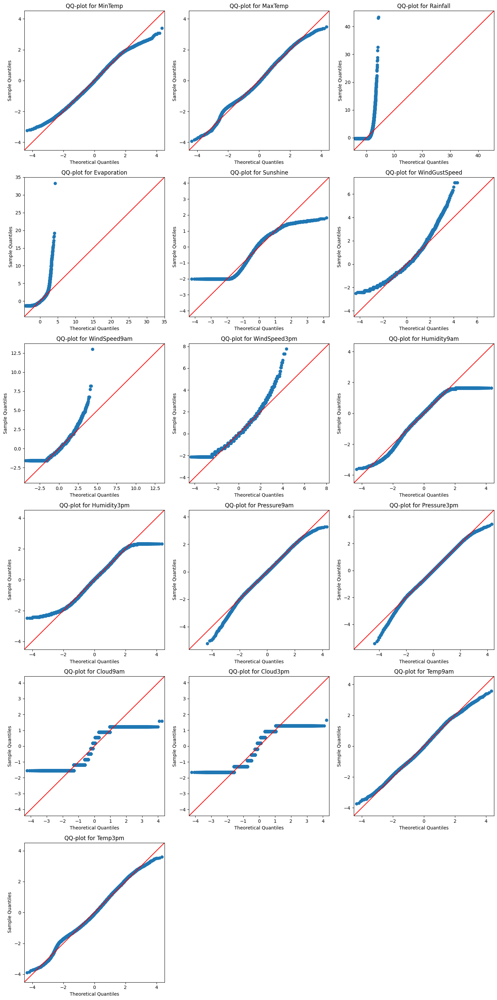

In [ ]:
plot_graph_on_grid(df, columns=cont_columns, num_cols=3, graph_type='qq-plot')

<p><em>
Del gráfico podemos verificar las medidas anteriores obtenidas (la no normalidad de las columnas antes analizadas).
</em></p>

###### 2.1.5.1.X. Valores faltantes

Analizamos los valores faltantes de todas las columnas:

In [ ]:
missing_values_df = df.isna().sum().reset_index()
missing_values_df.columns = ['Columna', 'Valores faltantes']

# Calcular el porcentaje de valores faltantes por columna
missing_percentage = (df.isna().sum() / len(df))
missing_values_df['Proporción de faltantes'] = missing_percentage.values.round(2)

# Ordenar de forma descendente según el porcentaje
missing_values_df = missing_values_df.sort_values(by='Proporción de faltantes',
                                                  ascending=False)

missing_values_df

,Columna,Valores faltantes,Proporción de faltantes
6,Sunshine,69835,0.48
5,Evaporation,62790,0.43
18,Cloud3pm,59358,0.41
17,Cloud9am,55888,0.38
15,Pressure9am,15065,0.10
16,Pressure3pm,15028,0.10
7,WindGustDir,10326,0.07
9,WindDir9am,10566,0.07
8,WindGustSpeed,10263,0.07
14,Humidity3pm,4507,0.03


<p><em>
Como podemos observar, hay muchos datos faltantes que deben ser analizados en las siguientes secciones.
</em></p>

Analizamos los valores faltantes de las columnas <code>RainToday</code> y <code>RainTomorrow</code>.

In [ ]:
columns = ["RainToday", "RainTomorrow"]
for column in columns:
    print(df[column].value_counts())
    print_missing_perc(df, column)
    print()

RainToday
0.0    110319
1.0     31880
Name: count, dtype: int64
Porcentaje de valores faltantes en la columna RainToday: 2.2%

RainTomorrow
0.0    110316
1.0     31877
Name: count, dtype: int64
Porcentaje de valores faltantes en la columna RainTomorrow: 2.2%



<p><em>
Se observa que la distribución de los valores que asumen las columnas son muy similares, lo cual tiene sentido debido a que el dataset elegido es una serie temporal y el valor de <code>RainTomorrow</code> en una observación es el valor de <code>RainToday</code> para el día siguiente.

Encontramos además la misma proporción de valores nulos en ambas columnas.
</em></p>

Analizamos las columnas <code>Date</code> y <code>Location</code>.

Para evaluar la coherencia interna del dataset verificamos que no haya observaciones con valor nulo en <code>RainTomorrow</code>, teniendo la observación del día siguiente con valor existente en la columna <code>RainToday</code>, para una misma estación meteorológica.

In [ ]:
diff_one_day = df["Date"].shift(-1) - df["Date"] == pd.Timedelta("1 day")
same_location = df["Location"] == df["Location"].shift(-1)
na_today_value_tomorrow = df["RainTomorrow"].isna() & ~(df["RainToday"].shift(-1).isna())

filt = diff_one_day & same_location & na_today_value_tomorrow
assert df.loc[filt, :].shape[0] == 0

Graficamos las observaciones diarias en función de la estación meteorológica para ver con que registros contamos.

In [ ]:
def plot_locations_over_time(df, color="blue"):
    locations = df["Location"].unique()

    _, ax = plt.subplots(figsize=(12, 7))

    # Plot data for each location
    for location in locations:
        filt = df["Location"] == location
        df_location = df.loc[filt, :]

        # Plot observations present in dataframe
        ax.plot(
            df_location["Date"],
            [location] * len(df_location),
            "o-",
            color=color,
            label=location,
            markersize=0.5,
            linewidth=0.05,
        )

        # Plot null values in target column
        null_indices = df_location.loc[df_location["RainTomorrow"].isnull()].index
        for idx in null_indices:
            ax.plot(df_location.loc[idx, "Date"], location, "ko", markersize=0.15)

    # Customize the plot
    ax.set_yticks(np.arange(len(locations)))
    ax.set_yticklabels(
        locations, fontsize="x-small"
    )  # Increase fontsize for y-axis labels
    ax.set_ylim(-0.5, len(locations) - 0.5)

    xticks = pd.date_range(start=df["Date"].min(), end=df["Date"].max(), freq="6MS")
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticks.strftime("%Y-%m"), fontsize="x-small", rotation=90)

    ax.grid(True, linestyle=":", alpha=0.5)

    legend_handles = [
        plt.Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            markerfacecolor="lightgreen",
            markersize=5,
            label="Observación presente en el dataframe",
        ),
        plt.Line2D(
            [0],
            [0],
            marker="o",
            color="w",
            markerfacecolor="black",
            markersize=5,
            label="Observación con valor ausente en la columna 'RainTomorrow'",
        ),
    ]
    ax.legend(
        handles=legend_handles,
        loc="upper center",
        bbox_to_anchor=(0.5, 1.075),
        ncol=2,
        fontsize=7,
    )

    plt.suptitle(
        "Observaciones presentes en la serie temporal por centro meteorológico",
        fontsize=10,
    )

    plt.show()

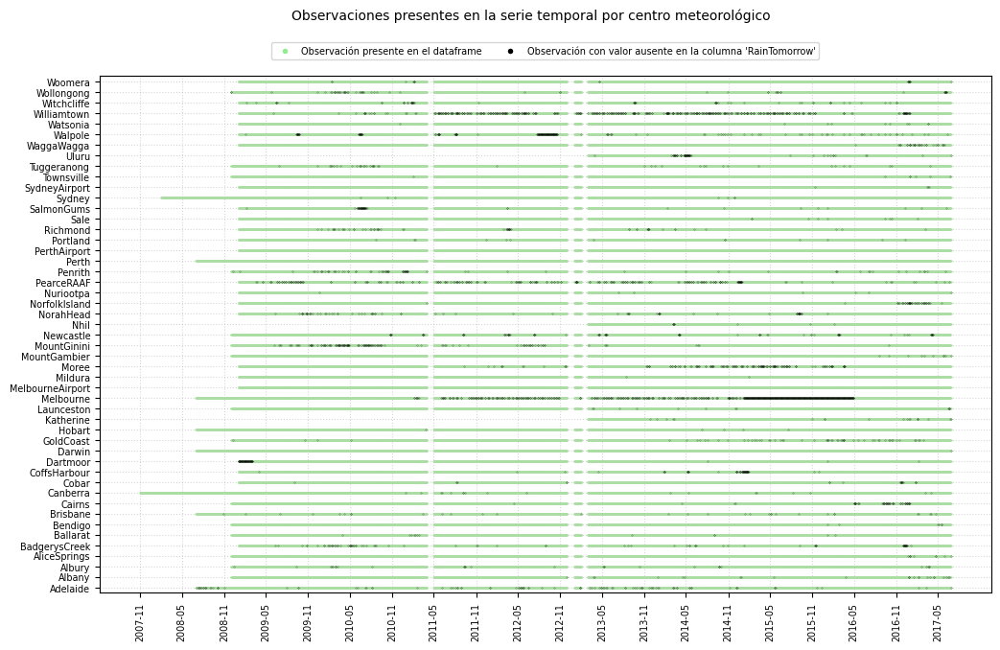

In [ ]:
plot_locations_over_time(df, color=spectral_palette[7])

<p><em>
Se observa que tenemos registros faltantes correspondientes a meses enteros para todas las estaciones meteorológicas. Además podemos observar que el inicio de la serie temporal para cada una de ellas difiere, siendo la observación más antigua de noviembre 2007.

Encontramos que en algunas de las localidades contamos con mayor cantidad de valores nulos en la columna target <code>RainTomorrow</code>. A priori esperábamos encontrar que los valores nulos para esa variable se encontraran dónde la serie temporal se corta, sin embargo podemos ver que aparecen aleatoriamente a lo largo de la serie temporal, y que en algunas locaciones incluso tenemos datos válidos en la variable <code>RainTomorrow</code> a pesar de no contar con una observación para el día siguiente al registrado.

Las estaciones con mayor cantidad de datos faltantes en la variable target son Melbourne y Wiliamtown. En lo que a Melbourne concierne, podemos observar que hay registros también en el aeropuerto de esa ciudad, por lo que podemos inferir que los patrones cimáticos de una de esas estaciones puede brindar información de utilidad para predecir si llueve al día siguiente en la otra. Extendiendo a todas las estaciones meteorológicas entendemos que incorporar la posición geográfica puede resultar de gran utilidad para el desarrollo de nuestro modelo predictivo.
</em></p>

###### 2.1.5.1.X. Valores atípicos

Para la detección de valores atípicos, primeramente realizamos diagramas de cajas para visualizar los datos. Estos diagramas de cajas también nos permiten las características anteriormente medidas, como la oblicuidad, media, mediana, etc; y así también validar estas métricas antes obtenidas.

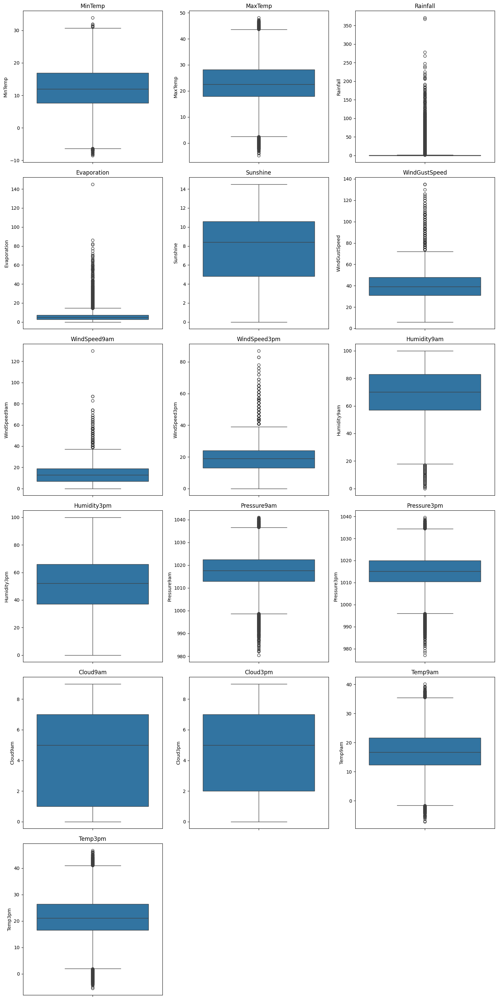

In [ ]:
plot_graph_on_grid(df, columns=cont_columns, num_cols=3, graph_type='box-plot')

<p><em>
Podemos observar que las siguentes columnas tienen outlíers:
</em></p>

- <code>MinTemp</code>
- <code>MaxTemp</code>
- <code>RainFall</code>
- <code>Evaporation</code>
- <code>WindGustSpeed</code>
- <code>WindSpeed9am</code>
- <code>WindSpeed3pm</code>
- <code>Humidity9am</code>
- <code>Pressure9am</code>
- <code>Pressure3pm</code>
- <code>Temp9am</code>
- <code>Temp3pm</code>

Porcentaje de outliers según IRQ y desviacón estándar:

In [ ]:
def outliers_iqr(df, columns):
    outliers = []
    for col in columns:
        # Rango itercuartílico
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        irq_lower_bound = Q1 - 1.5 * IQR
        irq_upper_bound = Q3 + 1.5 * IQR

        # Desviación estándar
        mean = df[col].mean()
        std = df[col].std()
        std_lower_bound = mean - 3 * std
        std_upper_bound = mean + 3 * std

        outliers.append({'Column': col,
                         'IRQ-Percentage': (((df[col] < irq_lower_bound) | (df[col] > irq_upper_bound)).sum() / len(df[col]) * 100).round(2),
                         '3Std-Percentage': (((df[col] < std_lower_bound) | (df[col] > std_upper_bound)).sum() / len(df[col]) * 100).round(2),
                         'IRQ-Count': ((df[col] < irq_lower_bound) | (df[col] > irq_upper_bound)).sum(),
                         '3Std-Count': ((df[col] < std_lower_bound) | (df[col] > std_lower_bound)).sum()
                         })
    return pd.DataFrame(outliers)

outliers = outliers_iqr(df, cont_columns).sort_values(by='IRQ-Percentage', ascending=False)
outliers

,Column,IRQ-Percentage,3Std-Percentage,IRQ-Count,3Std-Count
2,Rainfall,17.58,1.69,25578,142199
5,WindGustSpeed,2.13,0.94,3092,135197
7,WindSpeed3pm,1.73,0.66,2523,142398
3,Evaporation,1.37,0.60,1995,82670
6,WindSpeed9am,1.25,0.94,1817,143693
8,Humidity9am,0.98,0.32,1425,142806
10,Pressure9am,0.82,0.35,1191,130395
11,Pressure3pm,0.63,0.29,919,130432
15,Temp3pm,0.53,0.27,764,141851
1,MaxTemp,0.34,0.23,489,144199


<p><em>
Con la tabla podemos observar que aquellas columnas que se alejan de la distribución normal, como por ejemplo <code>Rainfall</code>, lo correcto sería tratar muchos más outliers mediante el rango inter cuartílico (que utiliza la mediana) que mediante la desviación estandar (que utiliza la media).
</em></p>

###### 2.1.5.1.X. Correlación entre datos

Análisis de correlación linear de los datos:

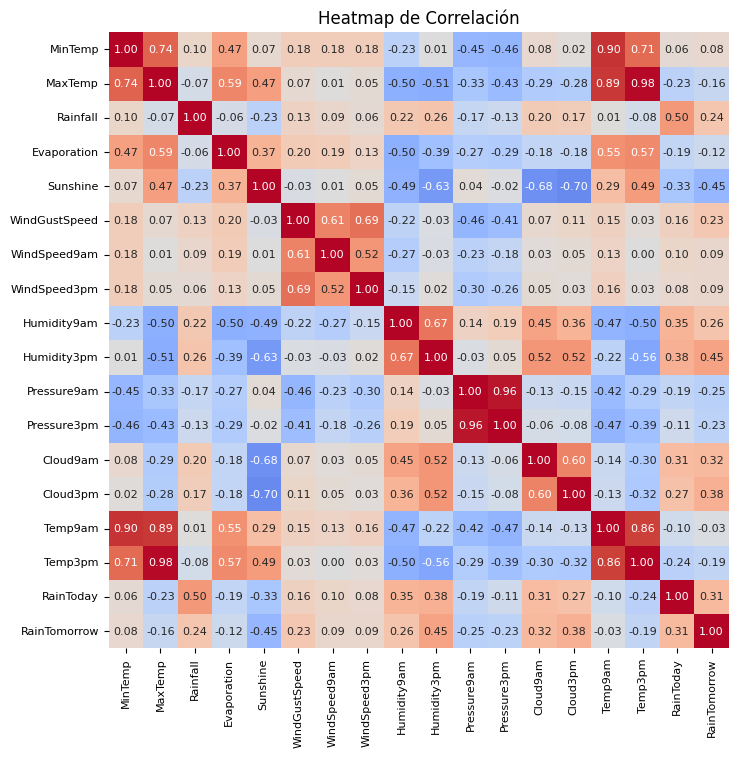

In [ ]:
def plot_heatmap(correlation_matrix, figsize=(8, 8)):
    plt.figure(figsize=figsize)
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", vmin=-1, vmax=1, annot_kws={"size": 8}, cbar=False)
    plt.title("Heatmap de Correlación")

    plt.xticks(fontsize=8)  # Adjust x-axis font size
    plt.yticks(fontsize=8)  # Adjust y-axis font size

    plt.show()

correlation_matrix = df.corr(numeric_only=True, method='pearson')

plot_heatmap(correlation_matrix)

<p><em>
Podemos apreciar que hay datos que están bastante corelacionados. Para mejor observación, graficamos las columnas cuya correlación es mayor a 0.75 (establecidos como correlación de intensidad fuerte):
</em></p>

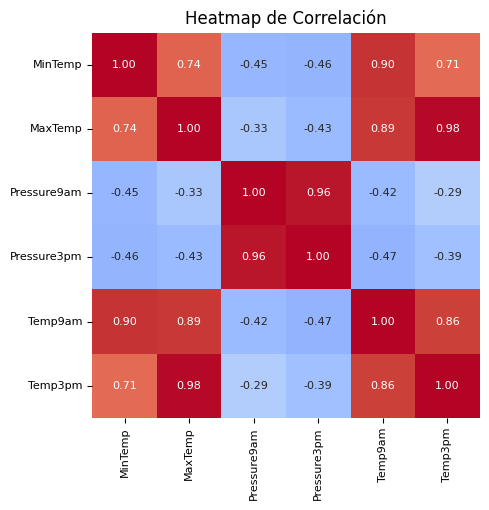

In [ ]:
# Eliminar la diagonal principal (auto-correlaciones)
mask = np.eye(len(correlation_matrix), dtype=bool)
correlation_matrix_no_diag = correlation_matrix.where(~mask)

# Encontrar columnas altamente correlacionadas
high_corr_columns = correlation_matrix_no_diag.columns[correlation_matrix_no_diag.abs().max() > 0.75]
high_corr_matrix = correlation_matrix.loc[high_corr_columns, high_corr_columns]

plot_heatmap(high_corr_matrix, figsize=(5, 5))

<p><em>
En este punto podemos ver las siguientes correlaciones fuertes:

<code>MinTemp</code> ⟷ <code>Temp9am</code>

<code>MaxTemp</code> ⟷ <code>Temp3am</code> | <code>Temp9am</code>

<code>Pressure9am</code> ⟷ <code>Pressure3pm</code>

<code>Temp3am</code> ⟷ <code>Temp9am</code>

La relación en todos los casos es directa.

Estas correlaciones hay que tenerlas en cuenta a la hora de entrenamor modelos que son suceptibles a este tipo de correlación (ej: modelos lineales). También hay que tener en cuenta estas correlaciones en el caso de necesitar imputación de datos.
</em></p>

Otra forma de ver la correlación y afirmar aún más nuestras hipotesis, es graficando par a par (pairplot):

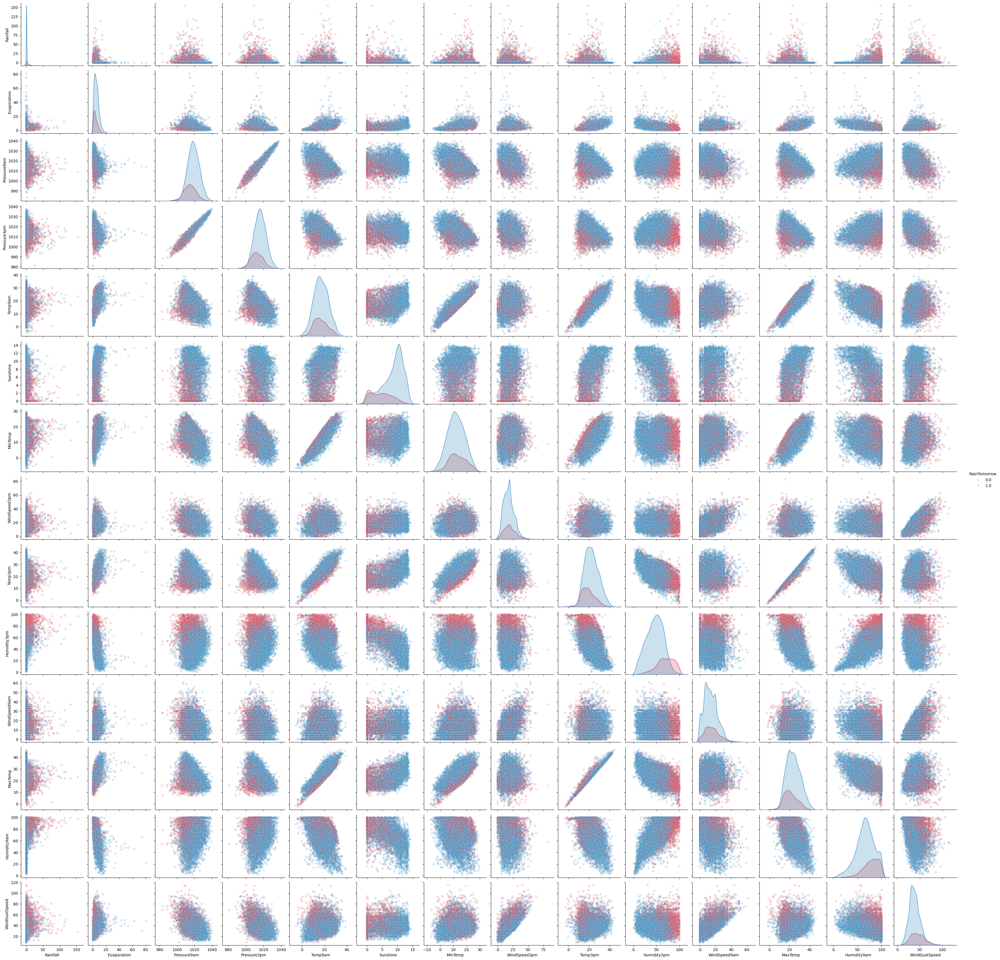

In [ ]:
# sns.pairplot(df)
columnas = list(set(cont_columns) - set(['Cloud9am', 'Cloud3pm']) | set(["RainTomorrow"]))
sns.pairplot(
    df[columnas].sample(10000, random_state=random_state),
    hue="RainTomorrow",
    palette=[spectral_palette[9], spectral_palette[1]],
    diag_kind="kde",
    plot_kws={'alpha': 0.2}
    )

_En este ploteo podemos observar la correlación lineal entre ciertas variables analizadas anteriormente. Además, encontramos que las variables Humidity3pm y Sunshine resultan sumamente promimsorias para la separación de clases en la variable objetivo. Sin embargo, recordamos que la variable Sunshine posee datos faltantes en casi la mitad de los registros. Realizar un buen trabajo de imputación de datos faltantes resulta entonces indispensable para obtener una buena performance en nuestro tarea predictiva._

Análisis de la correlación según <code>Date</code> y <code>Location</code>.

Geolocalizamos las estaciones meteorológicas utilizando el servicio Open Street Map para obtener la posición geográfica de cada una de ellas.

In [ ]:
country = "Australia"

world = gpd.read_file(get_path('naturalearth_lowres'))
gdf_australia = world[world.name == country]

# Solve manually some mistaken names
mapping_dict = {"Dartmoor": "DartmoorVillage", "Richmond": "RichmondSydney"}
df["Location"] = df["Location"].map(mapping_dict).fillna(df["Location"])

locations = df["Location"].unique()
locations = [re.sub(r'([a-z])([A-Z])', r'\1 \2', l) for l in locations]

locs = []
lats = []
lons = []
for location in locations:
  try:
    lat, lon = ox.geocode(location + f", {country}")

    locs.append(location.replace(" ", ""))
    lats.append(lat)
    lons.append(lon)
  except Exception as e:
    print(f"Error retrieving coordinates for {location}: {e}")

df_locations = pd.DataFrame({
    'Location': locs,
    'Lat': lats,
    'Lon': lons
})
geometry = [Point(lon, lat) for lon, lat in zip(df_locations['Lon'], df_locations['Lat'])]
gdf_locations = gpd.GeoDataFrame(df_locations, geometry=geometry, crs="EPSG:4326")

<ipython-input-83-017fead5d8cc>:3: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(get_path('naturalearth_lowres'))


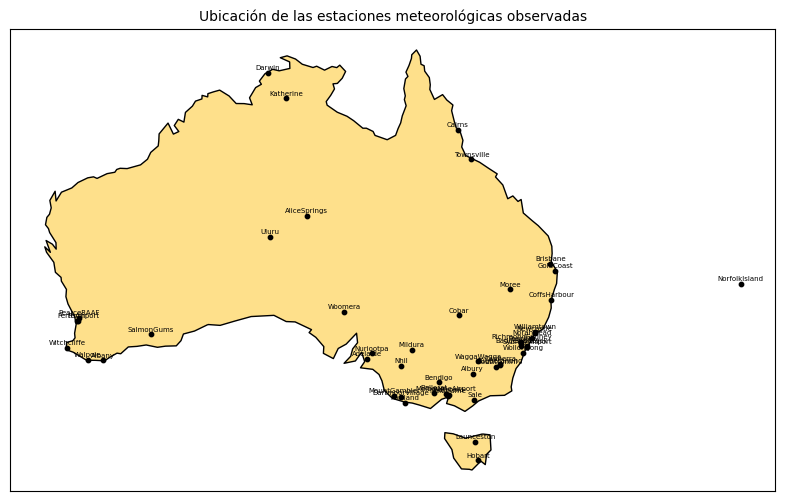

In [ ]:
fig, ax = plt.subplots(figsize=(10, 6))
gdf_australia.plot(ax=ax, edgecolor='k', facecolor=spectral_palette[4])

# Plot locations
gdf_locations.plot(ax=ax, marker='o', color='black', markersize=10, label='Locations')

for idx, row in gdf_locations.iterrows():
    ax.text(
        row['geometry'].x,
        row['geometry'].y + .2,
        row['Location'],
        fontsize=5,
        ha='center',
        va='bottom'
        )

ax.set_xticks([])
ax.set_yticks([])

ax.set_aspect('equal', adjustable='box')

plt.title(
        "Ubicación de las estaciones meteorológicas observadas",
        fontsize=10,
    )

plt.show()

<p><em>
Podemos ver una gran cantidad de estaciones meteorológicas concentradas en la costa sureste de Australia, y en menor medida en la costa suroeste. Además notamos que algunas de las estaciones se encuentran muy cercanas entre si, lo cual puede traer aparejado una correlación entre los patrones climáticos.
</em></p>

Analizamos el coeficiente Phi para la variable <code>RainToday</code> comparando entre pares de estaciones meteorológicas y cruzando con la información de la distancia euclideana entre ellas.

In [ ]:
locations = df["Location"].unique()
location_pairs = list(combinations(locations, 2))

df_location_pairs = pd.DataFrame(location_pairs, columns=['LocationA', 'LocationB'])
df_location_pairs['phi'] = np.nan
df_location_pairs['pvalue'] = np.nan

for index, row in df_location_pairs.iterrows():
    loc1, loc2 = row['LocationA'], row['LocationB']
    df_pair = df[df['Location'].isin([loc1, loc2])]
    df_pivot = df_pair.pivot(index='Date', columns='Location', values='RainToday').dropna()

    if not df_pivot.empty:
        confusion_matrix = pd.crosstab(df_pivot[loc1], df_pivot[loc2])
        phi, pvalue = phi_coefficient(confusion_matrix.values)
        df_location_pairs.at[index, 'phi'] = phi
        df_location_pairs.at[index, 'pvalue'] = pvalue

In [ ]:
df_location_a = df_location_pairs[["LocationA"]].merge(
    gdf_locations[["Location", "geometry"]],
    how="left",
    left_on="LocationA",
    right_on="Location",
)
gdf_location_a = gpd.GeoDataFrame(df_location_a, geometry="geometry")
gdf_location_a_gda94 = gdf_location_a.to_crs(epsg=3112)

df_location_b = df_location_pairs[["LocationB"]].merge(
    gdf_locations[["Location", "geometry"]],
    how="left",
    left_on="LocationB",
    right_on="Location",
)
gdf_location_b = gpd.GeoDataFrame(df_location_b, geometry="geometry")
gdf_location_b_gda94 = gdf_location_b.to_crs(epsg=3112)

distance_ab = gdf_location_a_gda94["geometry"].distance(gdf_location_b_gda94["geometry"])

df_location_pairs["distance"] = distance_ab / 1000 # distance in kilometers

In [ ]:
df_location_pairs.sort_values(by="phi", ascending=False).head(10)

,LocationA,LocationB,phi,pvalue,distance
1023,Perth,PerthAirport,0.868273,0.000000e+00,10.170125
1110,Sydney,SydneyAirport,0.834880,0.000000e+00,9.159054
426,Canberra,Tuggeranong,0.834520,0.000000e+00,13.690617
988,PearceRAAF,PerthAirport,0.811493,0.000000e+00,29.675737
1008,Penrith,RichmondSydney,0.794405,0.000000e+00,17.339476
987,PearceRAAF,Perth,0.776889,0.000000e+00,34.306090
519,DartmoorVillage,MountGambier,0.776575,0.000000e+00,45.125869
211,BadgerysCreek,Penrith,0.774937,0.000000e+00,15.112316
736,Melbourne,Watsonia,0.759375,2.271215e-283,15.719700
215,BadgerysCreek,RichmondSydney,0.740126,0.000000e+00,30.966137


<p><em>
Observamos que, tal como intuíamos, las estaciones con mayor coeficiente Phi tienen entre si para la variable <code>RainToday</code>, son aquellos que se encuentran cerca geográficamente.
</em></p>

Vamos a gráficar la relación entre la distancia geográfica y la correlación calculada mediante el coeficiente Phi para todos los pares de estaciones meteorológicas en el dataset.

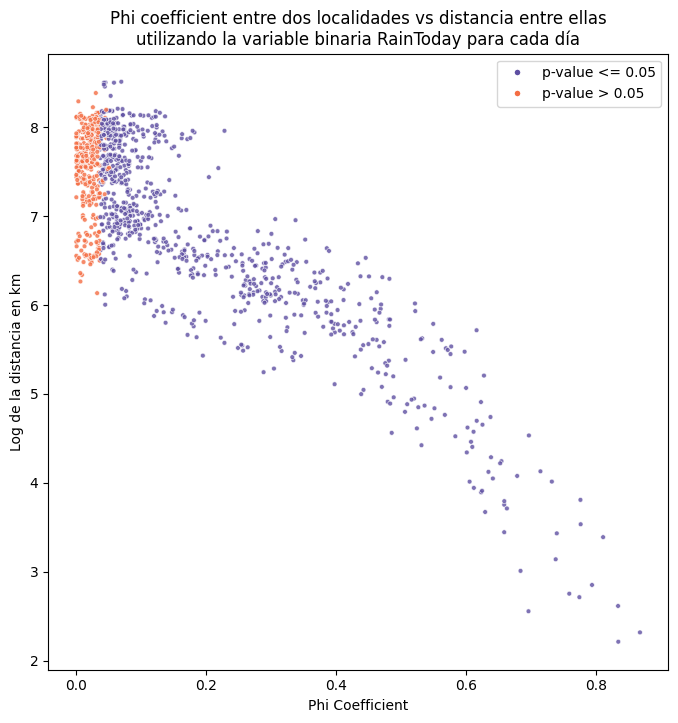

In [ ]:
plt.figure(figsize=(8, 8))

df_location_pairs["significant"] = df_location_pairs['pvalue'] <= .05
colors = [spectral_palette[10] if sig else spectral_palette[2] for sig in df_location_pairs['significant']]

sc = plt.scatter(df_location_pairs['phi'], np.log(df_location_pairs['distance']),
                 s=12, c=colors, alpha=.8, edgecolors='w', linewidth=0.5)

plt.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=spectral_palette[10], markersize=5, label='p-value <= 0.05'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=spectral_palette[2], markersize=5, label='p-value > 0.05')
])

plt.xlabel('Phi Coefficient')
plt.ylabel('Log de la distancia en km')
plt.title('Phi coefficient entre dos localidades vs distancia entre ellas\nutilizando la variable binaria RainToday para cada día')

plt.show()

<p><em>
Efectivamente, encontramos una importante correlación visual entre ambas variables graficadas: la distancia y la correlación para la variable <code>RainToday</code> para cada par de estaciones.

Esta situación resulta interesante en cuanto refuerza nuestra hipótesis de que la codificación espacial de las estaciones meteorológicas resulta informativa para un modelo encargado de predecir lluvia para el día siguiente.

Además, entendemos que debemos de estar atentos al momento de dividir nuestro dataset para entrenamiento y testeo del mismo. Si entrenamos nuestro modelo con datos de un día específico en estaciones meteorológicas cercanas entre si, y luego lo testeamos con una observación del mismo día pero de otra estación también cercana, corremos el riesgo de que el modelo aprenda que en esa zona geográfica llovió al día siguiente en lugar de realmente realizar una predicción desconociendo el futuro. Por esto consideramos que nuestro set de testeo y validación debe comprender un periodo de tiempo definido e incluir a todas las estaciones para ese período.
</em></p>

Finalmente vamos a analizar la relación existente entre la variables categóricas relacionadas a la dirección que puede tomar el viento. Como vimos anteriormente son 16 las categorías posibles.

In [ ]:
wind_dir_columns = ["WindGustDir", "WindDir9am", "WindDir3pm"]

uniques_dirs = set(chain.from_iterable(df[column].unique() for column in wind_dir_columns))
print("Valores tipo string en las columnas WindDir: ", ' - '.join(d for d in uniques_dirs if isinstance(d, str)))
print("Otros valores en las columnas WindDir: ",' - '.join(str(d) for d in uniques_dirs if not isinstance(d, str)))

Valores tipo string en las columnas WindDir:  WNW - ENE - ESE - NE - W - NNE - N - SE - SSE - NW - E - SSW - NNW - S - WSW - SW
Otros valores en las columnas WindDir:  nan


Se observan 16 categorías, cada una de ellas representando una dirección posible del viento con una resolución de 22.5°. Vamos a transformar la dirección del viento a grados considerando la dirección 'E' como nuestro 0° (y por lo tanto también nuestro 360°). Este método nos permitirá ordenar los valores para poder analizar graficamente la relación entre las variables WindDir9am y WindDir3pm.

In [ ]:
df_wind_dir = df[wind_dir_columns]

dirs = ["E", "ENE", "NE", "NNE", "N", "NNW", "NW", "WNW", "W", "WSW", "SW", "SSW", "S", "SSE", "SE", "ESE"]
angles = list(np.arange(0, 360, 22.5))
mapping_dict = {d: a for (d, a) in zip(dirs, angles)}

df_wind_dir[wind_dir_columns] = df_wind_dir[wind_dir_columns].applymap(lambda x: mapping_dict.get(x, x))

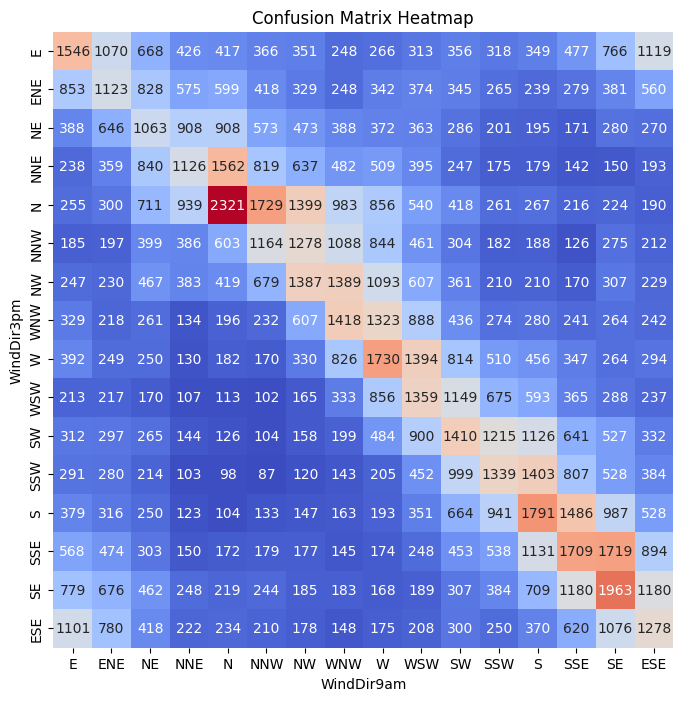

In [ ]:
confusion_matrix = pd.crosstab(df_wind_dir["WindDir9am"], df_wind_dir["WindDir3pm"])

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 8))
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='coolwarm', xticklabels=dirs, yticklabels=dirs, cbar=False)
plt.xlabel('WindDir9am')
plt.ylabel('WindDir3pm')
plt.title('Confusion Matrix Heatmap')
plt.show()

_Se observa una estrecha relación visual entre la dirección del viento registrada a las 9am y la dirección del viento registrada a las 3pm. Debido a la condición circular de las posibles direcciones que el viento puede tomar, aparecen valores altos en las esquinas inferior izquierda y superior derecha del gráfico._

##### 2.1.5.2. Requerimientos de datos

<mark> ⚠ TODO: Se debería poner un resumen de lo visto anteriormente. Esto es, las acciones que se deberían tener en cuenta en la parte de ingeniería de los datos, así como tabmbién puntos a tener en cuenta identificados.

<!-- TODO -->

#### 2.1.6. Revisión de los documentos de salida

<!-- TODO: Borrar? -->

### 2.2. Ingeniería de datos (Data Engineering)

> Debería tener en cuenta los siguientes puntos:
> - Select data
>     - Feature selection (uppon domain kwnonledge)
>         - Filter methods
>         - Wrapper methods
>         - Embedded methods
>     - Data selection
>         - Descarting samples that don't satisfy with quality criteria
>     - Unbalanced classes
>         - Over-sampling and under-sampling
> - Clean data
>     - Noise reduction
>     - Data imputation
>     - Compare the model performance between different imputation techniques
> - Construct data
>     - Feature engineering
>         - Feature transformation (time domain to frecuency domain)
>         - Discretization of continuous fetures
>         - Augmenting the features with additional features
>         - Clustering
>         - Dimensional reduction
>         - Codificar variables nominales
>         - Transformar variables ordinales a numéricas
>         - Data masking if needed
>     - Data augmentation
>         - Ex: Gaussian noise to an image or elastic deformation
> - Standarize data
>     - File format
>     - Normalization

#### 2.2.1. Seleccionar datos

<!-- TODO: Seleccionar características importantes según el conocimiento del negocio. También ver si la correlación no impacta en los atributos de entrada. Es una buen práctica descartar características que no son importantes ya que no aportan al modelo pero ofrecen posibles puntos de errores -->

#### 2.2.2. Limpiar datos

<!-- TODO: Reducción de ruido e imputación de datos -->

##### 2.2.2.1 Imputaciones
Como se observó en la sección anterior, se tienen variables tanto numéricas como categóricas a las que les faltan algunos valores.

###### Considerando las variables categóricas:
Se toma la moda para completar los valores faltantes.

Sin embargo, para el caso de "RainToday" y "RainTomorrow", el porcentaje de valores faltantes es bajo (~2%) y parece ser aleatorio; por lo que podríamos excluir las observaciones donde estas columnas no tengan estos valores.

In [ ]:
columnas_cat = ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm']

In [ ]:
df_cat_imputed = df.copy()

# Imputación con la Moda para Variables Categóricas
categorical_imputer = SimpleImputer(strategy='most_frequent')
df_cat_imputed[columnas_cat] = categorical_imputer.fit_transform(df_cat_imputed[columnas_cat])

In [ ]:
missing_values = df_cat_imputed.isna().sum()
observations = len(df_cat_imputed)

missing_values_df = pd.DataFrame({
    'Variable': missing_values.index,
    'Valores faltantes': missing_values.values,
    'Cantidad de observaciones': observations,
    'Porcentaje valores faltantes': (missing_values.values / observations) * 100
})

missing_values_df.sort_values(by="Porcentaje valores faltantes", ascending=0)

,Variable,Valores faltantes,Cantidad de observaciones,Porcentaje valores faltantes
6,Sunshine,69835,145460,48.009762
5,Evaporation,62790,145460,43.166506
18,Cloud3pm,59358,145460,40.807095
17,Cloud9am,55888,145460,38.421559
15,Pressure9am,15065,145460,10.356799
16,Pressure3pm,15028,145460,10.331363
8,WindGustSpeed,10263,145460,7.055548
14,Humidity3pm,4507,145460,3.098446
20,Temp3pm,3609,145460,2.481094
22,RainTomorrow,3267,145460,2.245978


In [ ]:
# Retiramos las observaciones sin valores de "RainToday" y "RainTomorrow"
invalid_rows = df[df['RainToday'].isna() | df['RainTomorrow'].isna()].index

df_cat_imputed.drop(invalid_rows, inplace=True)
df_cat_imputed.shape

(140787, 23)

In [ ]:
# Chequeamos los valores de nuevo
missing_values = df_cat_imputed.isna().sum()
observations = len(df_cat_imputed)

missing_values_df = pd.DataFrame({
    'Variable': missing_values.index,
    'Valores faltantes': missing_values.values,
    'Cantidad de observaciones': observations,
    'Porcentaje valores faltantes': (missing_values.values / observations) * 100
})

missing_values_df.sort_values(by="Porcentaje valores faltantes", ascending=0)

,Variable,Valores faltantes,Cantidad de observaciones,Porcentaje valores faltantes
6,Sunshine,66805,140787,47.451114
5,Evaporation,59694,140787,42.400222
18,Cloud3pm,56094,140787,39.843167
17,Cloud9am,52625,140787,37.379161
16,Pressure3pm,13769,140787,9.780022
15,Pressure9am,13743,140787,9.761555
8,WindGustSpeed,9105,140787,6.467216
14,Humidity3pm,3501,140787,2.486735
20,Temp3pm,2624,140787,1.863808
12,WindSpeed3pm,2531,140787,1.797751


###### Considerando las variables numéricas:

Considerando que las faltas son por razones aleatorias, y, dado que la mayoría de las variables presentan oblicuidad, se considera la mediana como un buen candidato para reemplazar a los valores faltantes. Para este caso, se puede utilizar el SimpleImputer considerando una imputación de una variable.

Alternativamente, se puede utilizar un método multivariado como KNN (vecinos cercanos) y comparar con la imputación simple.

De esta forma se tienen dos alternativas que pueden compararse para determinar cuál es mejor.

In [ ]:
from sklearn.impute import SimpleImputer, KNNImputer

# SimpleImputer (mediana)
def simple_imputer_mean(df, numerical_vars):
    imputer = SimpleImputer(strategy='mean')
    df[numerical_vars] = imputer.fit_transform(df[numerical_vars])
    return df

# KNN Imputer
def knn_imputer(df, numerical_vars, n_neighbors=5):
    imputer = KNNImputer(n_neighbors=n_neighbors)
    df[numerical_vars] = imputer.fit_transform(df[numerical_vars])
    return df

In [ ]:
columnas_num = ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
                'WindGustSpeed','WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
                'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am','Temp3pm']

In [ ]:
# Se realiza la imputación simple de una sola variable utilizando la mediana:
df_mean_imputed = simple_imputer_mean(df_cat_imputed.copy(), columnas_num)
df_mean_imputed.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,5.472516,7.63054,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.49925,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,5.472516,7.63054,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,4.431161,4.49925,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,5.472516,7.63054,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,4.431161,2.00000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,5.472516,7.63054,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,4.431161,4.49925,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,5.472516,7.63054,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.000000,8.00000,17.8,29.7,No,No


In [ ]:
# Se realiza la imputación multivariada utilizando los vecinos cercanos (KNN):
df_knn_imputed = knn_imputer(df_cat_imputed.copy(), columnas_num, n_neighbors=3)
df_knn_imputed.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,3.733333,10.033333,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.000000,4.333333,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,6.733333,10.033333,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,0.666667,0.666667,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,5.400000,10.033333,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,0.333333,2.000000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,9.066667,10.033333,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,2.333333,2.666667,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,4.400000,10.033333,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No


De esta forma se tienen dos opciones para comparar:
`df_mean_imputed` y `df_knn_imputed`

##### Análisis postimputación

Para entender cómo ha cambiado el dataset luego de las dos alternativas de imputación para los datos numéricos, se puede realizar una análisis de las estadísticas descriptivas del dataset.

In [ ]:
# Estadísticas descriptivas
original = df.describe()
mean_imputed_stats = df_mean_imputed.describe()
knn_imputed_stats = df_knn_imputed.describe()

# Se muestran las estadísticas para comparar
print("Estadísticas: dataset original:\n", original)
print("\nEstadísticas: imputación (mediana):\n", mean_imputed_stats)
print("\nEstadísticas: imputación (KNN):\n", knn_imputed_stats)

Estadísticas: dataset original:
              MinTemp        MaxTemp       Rainfall   Evaporation  \
count  143975.000000  144199.000000  142199.000000  82670.000000   
mean       12.194034      23.221348       2.360918      5.468232   
std         6.398495       7.119049       8.478060      4.193704   
min        -8.500000      -4.800000       0.000000      0.000000   
25%         7.600000      17.900000       0.000000      2.600000   
50%        12.000000      22.600000       0.000000      4.800000   
75%        16.900000      28.200000       0.800000      7.400000   
max        33.900000      48.100000     371.000000    145.000000   

           Sunshine  WindGustSpeed   WindSpeed9am   WindSpeed3pm  \
count  75625.000000  135197.000000  143693.000000  142398.000000   
mean       7.611178      40.035230      14.043426      18.662657   
std        3.785483      13.607062       8.915375       8.809800   
min        0.000000       6.000000       0.000000       0.000000   
25%        4.8

Analisis por variable. Se consideran solo las que tenían un gran porcentaje de valores faltantes (>10%)

In [ ]:
def plot_distributions(original, mean_imputed, knn_imputed, variable, figsize=(15, 3)):
    plt.figure(figsize=figsize)

    # Original data
    plt.subplot(1, 3, 1)
    sns.histplot(original[variable].dropna(), kde=True)
    plt.title(f'Original: "{variable}"')

    # Mean imputed data
    plt.subplot(1, 3, 2)
    sns.histplot(mean_imputed[variable], kde=True)
    plt.title(f'Imputación (mediana): "{variable}"')

    # KNN imputed data
    plt.subplot(1, 3, 3)
    sns.histplot(knn_imputed[variable], kde=True)
    plt.title(f'Imputación (KNN): "{variable}"')

    plt.show()

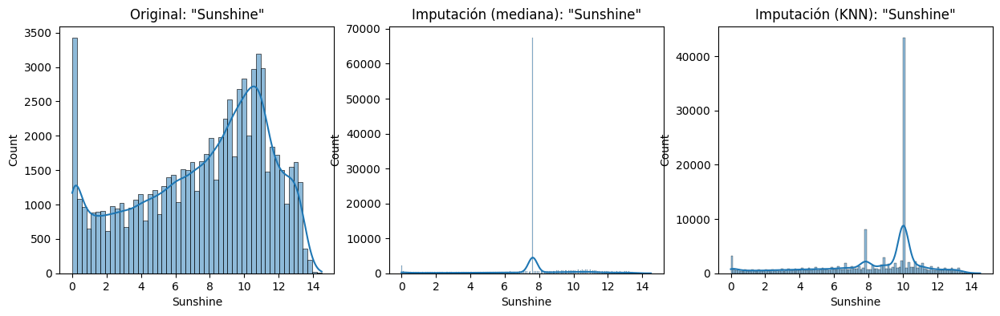

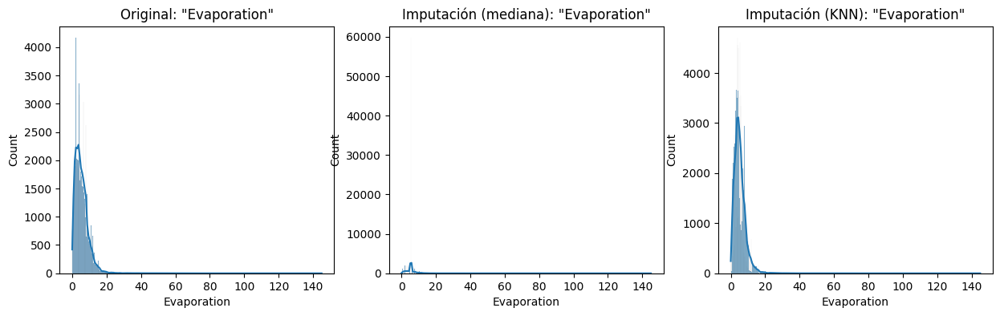

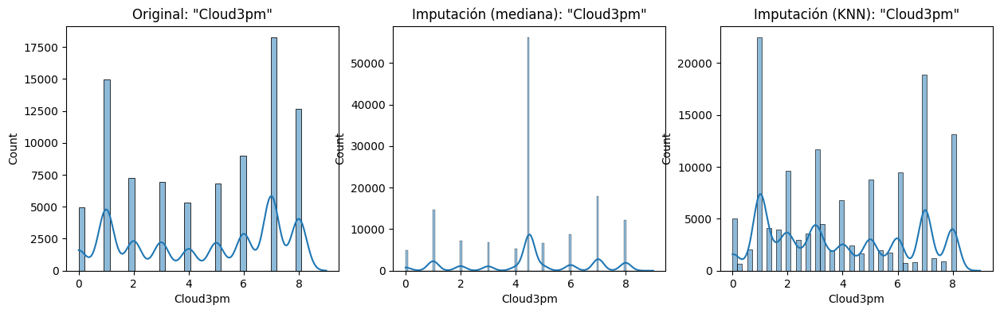

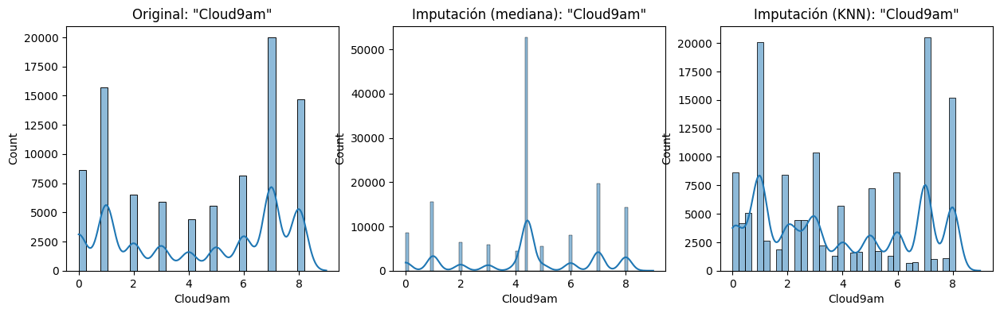

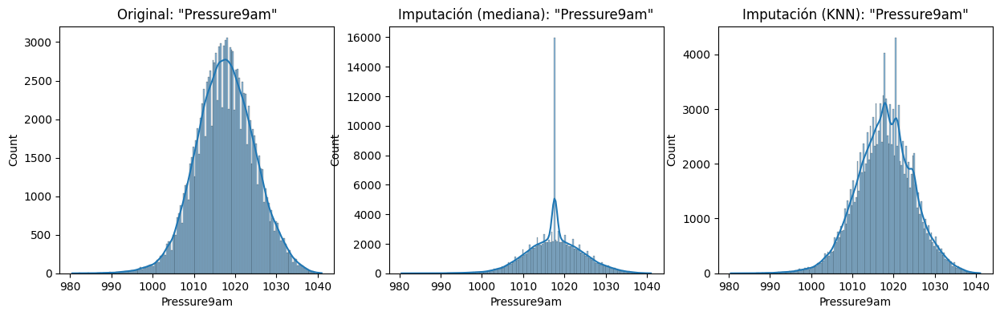

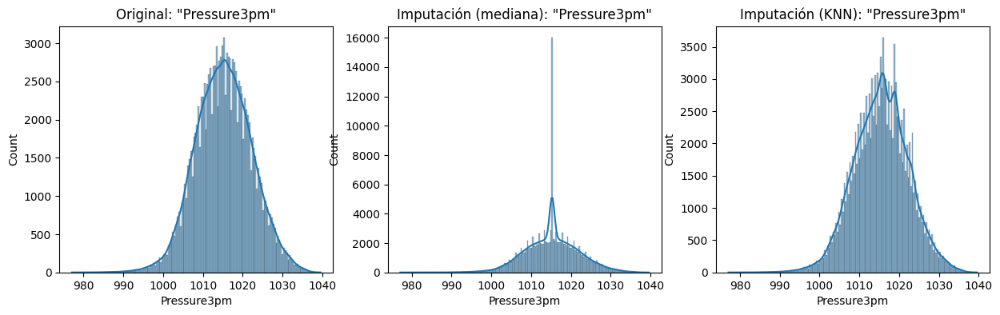

In [ ]:
# Sunshine (48%), Evaporation (43%), Cloud3pm (40%), Cloud9am (38%), Pressure9am (10%), Pressure3pm (10%)
top_six = ['Sunshine', 'Evaporation', 'Cloud3pm', 'Cloud9am', 'Pressure9am', 'Pressure3pm']

for variable in top_six:
  plot_distributions(df, df_mean_imputed, df_knn_imputed, variable, figsize=(15, 4))

Como se puede observar en los gráficos, las distribuciones se han visto afectadas (en especial "Sunshine") por las imputaciones.

El caso de Sunshine es particular y debería ser analizado a mayor profundidad para entender que opciones pueden existir para eliminar el sesgo excesivo que se observa.

En general, el método de imputación utilizando KNN es mejor que el método que se basa solamente en la mediana.

#### 2.2.3. Codificar de variables categóricas

A partir del análisis realizado hasta el momento encontramos las siguientes variables categóricas a codificar:

- "Date"
- "Location"
- "WindGustDir", "WindDir9am", "WindDir3pm"

##### Variable "Date"

Cada observación se registra con el día, mes y año. Sin embargo, tratar estos componentes como características independientes presenta varios inconvenientes:

Días del mes:
- La representación numérica entera de los días no refleja la condición circular de anterioridad de los días altos de un mes respecto a los bajos del siguiente. Además, los meses tienen diferentes números de días por lo que aun si el modelo logra capturar esa circularidad, puede ser dificultoso entender que la distancia entre un determinado número de día y otro no es siempre la misma (ej. entre el 28 de un mes y el 1 del siguiente puede haber 1 o 4 días).
- El valor numérico del día en un mes no informa directamente sobre la probabilidad de lluvia para el día siguiente.

Meses:
- Tienen una moderadamente alta cardinalidad para ser representados mediante one-hot encoding. pAdemás, esta técnica otorga la misma distancia euclideana a cada par de vectores que representan cada uno de los 12 meses.
- Si se usan valores enteros del 1 al 12, se pierde la circularidad, complicando la interpretación de la distancia temporal entre los útlimos meses y los primeros.

Años:
- Son informativos para variaciones climáticas anuales, pero pueden introducir problemas al generalizar a datos de años no vistos durante el entrenamiento.

Por estas razones, codificamos la fecha como el número de día del año, utilizando coordenadas polares para reflejar su estructura circular. De este modo se traduce la información brindada por la fecha a su ubicación dentro de un año calendario, codificandola en dos nuevas variables.

In [ ]:
def plot_day_of_year_in_unit_circle():
    # Create a DataFrame to hold the values
    days = np.arange(1, 366, 2)
    days_in_year = 366

    angles = 2 * np.pi * (days - 1) / days_in_year
    cos_vals = np.cos(angles)
    sin_vals = np.sin(angles)

    df_days = pd.DataFrame({
        'Day': days,
        'Angle': angles,
        'DayCos': cos_vals,
        'DaySin': sin_vals
    })

    # Randomly select a day
    random_day = 37
    random_day_row = df_days[df_days['Day'] == random_day]

    # Plot the circle with 365 dots
    plt.figure(figsize=(5, 5))
    plt.plot(df_days['DayCos'], df_days['DaySin'], 'bo', markersize=1)  # Circle with 365 dots

    # Highlight the random day
    plt.plot(random_day_row['DayCos'], random_day_row['DaySin'], 'ro', markersize=2)
    plt.text(random_day_row['DayCos'].values[0] + 0.02, random_day_row['DaySin'].values[0],
            f"Day {random_day}\n({random_day_row['DayCos'].values[0]:.2f},{random_day_row['DaySin'].values[0]:.2f})",
            fontsize=6, ha='left', va='bottom')

    # Draw x and y axes
    plt.axhline(0, color='grey', linestyle='--', linewidth=0.5)
    plt.axvline(0, color='grey', linestyle='--', linewidth=0.5)

    # Draw the angle
    plt.plot([0, 1], [0, 0], 'k-', linewidth=1)
    plt.plot([0, random_day_row['DayCos'].values[0]], [0, random_day_row['DaySin'].values[0]], 'k-', linewidth=1)

    angle_text = f"{np.degrees(random_day_row['Angle'].values[0]):.2f}°"
    label_angle = random_day_row['Angle'].values[0] / 4
    plt.text(0.3 * np.cos(label_angle) + 0.05, 0.3 * np.sin(label_angle) + 0.05, angle_text, color='k', fontsize=8, ha='center', va='center')

    # Mark and label the cosine value on the axes
    plt.plot([random_day_row['DayCos'].values[0], random_day_row['DayCos'].values[0]], [0, random_day_row['DaySin'].values[0]], 'k--', linewidth=0.4)
    plt.text(random_day_row['DayCos'].values[0], -0.05,
            f"{random_day_row['DayCos'].values[0]:.2f}",
            fontsize=7,
            ha='center',
            va='top')

    plt.plot([0, random_day_row['DayCos'].values[0]], [random_day_row['DaySin'].values[0], random_day_row['DaySin'].values[0]], 'k--', linewidth=0.4)
    plt.text(-0.05, random_day_row['DaySin'].values[0],
            f"{random_day_row['DaySin'].values[0]:.2f}",
            fontsize=7,
            ha='right',
            va='center')

    # Set equal aspect ratio
    plt.gca().set_aspect('equal', adjustable='box')

    # Labels and title
    plt.xlabel('DayCos')
    plt.ylabel('DaySin')
    plt.title('Representación del día del año en coordenadas polares', fontsize=10)

    plt.tick_params(axis='both', labelsize=6)

    plt.show()

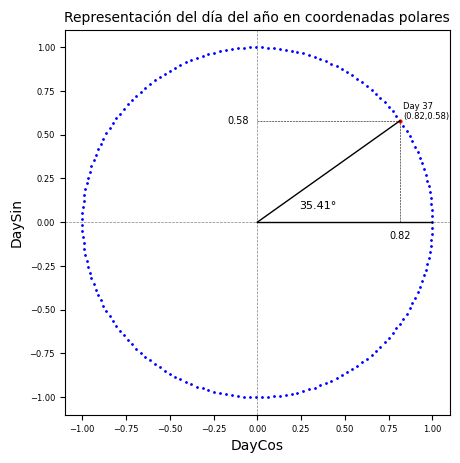

In [ ]:
plot_day_of_year_in_unit_circle()

_Codificar la fecha de esta manera cuenta con la ventaja de que indirectamente estamos incorporando la información de las estaciones del año, ya que para valores positivos de CosDay y SinDay nos encontramos con días de verano mientras que para valores negativos de ambos lo hacemos con días de invierno. En la diagonal opuesta sucede algo similar con días de primavera y otoño._

In [ ]:
df['DayOfYear'] = df['Date'].dt.dayofyear

# Determine the number of days in the year for each date (taking leap years into account)
df['DaysInYear'] = df['Date'].dt.is_leap_year.apply(lambda leap: 366 if leap else 365)

# Convert day of the year to angle in radians, dividing by DaysInYear + 1
df['Angle'] = 2 * np.pi * (df['DayOfYear'] - 1) / (df['DaysInYear'])

df['DayCos'] = np.cos(df['Angle'])
df['DaySin'] = np.sin(df['Angle'])

df = df.drop(columns=["DayOfYear", "DaysInYear", "Angle"])

Vamos a entrenar un modelo de Regresión Logística utilizando únicamente las columnas creadas como features para predecir la variable objetivo "RainTomorrow". Vamos a comparar los resultados obtenidos mediante esa codificación con la codificación ordinal del día y el mes para examinar el desempeño de la técnica utilizada.

In [ ]:
# Initialize lists to store results
random_states = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
polar_results = []
integer_results = []

# Methodology 1: DayCos, DaySin
df_model_cos_sin = df[["DayCos", "DaySin", "RainTomorrow"]]
df_model_cos_sin = df_model_cos_sin.dropna(how='any').reset_index(drop=True)

# Methodology 2: Day, Month
df_model_day_month = df[["Date", "RainTomorrow"]]
df_model_day_month["Day"] = df_model_day_month["Date"].dt.day
df_model_day_month["Month"] = df_model_day_month["Date"].dt.month
df_model_day_month = pd.get_dummies(df_model_day_month, columns=["Month"], drop_first=True, dtype=int)
df_model_day_month = df_model_day_month.drop(columns="Date")
df_model_day_month = df_model_day_month.dropna(how='any').reset_index(drop=True)

for random_state in random_states:
    # Methodology 1: DayCos, DaySin
    X1 = df_model_cos_sin.drop(columns="RainTomorrow")
    y1 = df_model_cos_sin["RainTomorrow"]
    X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=random_state)

    scaler = StandardScaler()
    X1_train_scaled = scaler.fit_transform(X1_train)
    X1_test_scaled = scaler.transform(X1_test)

    model1 = LogisticRegression(class_weight='balanced')
    model1.fit(X1_train_scaled, y1_train)
    y1_pred = model1.predict(X1_test_scaled)

    acc1 = accuracy_score(y1_test, y1_pred)
    f1_1 = f1_score(y1_test, y1_pred)

    polar_results.append({
        'RandomState': random_state,
        'PolarAccuracy': round(acc1, 3),
        'PolarF1': round(f1_1, 3)
    })

    # Methodology 2: Day, Month
    X2 = df_model_day_month.drop(columns="RainTomorrow")
    y2 = df_model_day_month["RainTomorrow"]
    X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=random_state)

    scaler = StandardScaler()
    X2_train_scaled = scaler.fit_transform(X2_train)
    X2_test_scaled = scaler.transform(X2_test)

    model2 = LogisticRegression(class_weight='balanced')
    model2.fit(X2_train_scaled, y2_train)
    y2_pred = model2.predict(X2_test_scaled)

    acc2 = accuracy_score(y2_test, y2_pred)
    f1_2 = f1_score(y2_test, y2_pred)

    integer_results.append({
        'RandomState': random_state,
        'IntegerAccuracy': round(acc2, 3),
        'IntegerF1': round(f1_2, 3)
    })

# Create DataFrames from results
polar_df = pd.DataFrame(polar_results)
integer_df = pd.DataFrame(integer_results)

# Merge the DataFrames on 'RandomState'
comparison_df = pd.merge(polar_df, integer_df, on='RandomState')

# Display the comparison DataFrame
comparison_df

,RandomState,PolarAccuracy,PolarF1,IntegerAccuracy,IntegerF1
0,10,0.522,0.333,0.581,0.317
1,20,0.524,0.333,0.581,0.319
2,30,0.521,0.335,0.576,0.324
3,40,0.525,0.337,0.600,0.312
4,50,0.523,0.339,0.583,0.330
5,60,0.519,0.331,0.577,0.316
6,70,0.523,0.339,0.594,0.325
7,80,0.522,0.337,0.577,0.326
8,90,0.520,0.332,0.560,0.319
9,100,0.524,0.337,0.595,0.321


_Observamos que los resultados obtenidos con la codificación de las fechas en coordenadas polares tuvo una performance superior para el F1 score para todos los valores de random state seleccionados. Si bien el accuracy de los modelos codificados con el número para el día y one-hot pára los meses es superior, recordamos que debido al desbalanceo entre clases, el accuracy se encuentra inflado para modelos que predicen mayormente que no llueve. Por otro lado, el F1 score refleja un balance entre la precisión y la sensibilidad del modelo._

##### Variable "Location"

Como evaluamos en el apartado anterior, la distancia entre estaciones meteorológicas es inversamente proporcional al coeficiente Phi para la variable RainToday. En decir, si en una estación se registra lluvia, es probable que en una estación cercana también se registre la misma condición.

Vamos a codificar la locación a partir de las coordenadas de Latitud y Longitud obtenidas mediante geolocalización con Open Street Map. De este modo informamos al modelo con la relación espacial entre las estaciones. Además, evitamos la representación dispersa que implicara utilizar one hot encoding con una variable de alta cardinalidad.

In [ ]:
df = pd.merge(df, gdf_locations.drop(columns="geometry"), on="Location")

##### Variables "WindDir"

Al igual que sucede con la variable de fecha, las variables relacionadas con la dirección del viento también poseen un orden circular. En el caso de estas últimas variables, incluso, necesitamos un menor grado de abstracción ya que la dirección del viento puede representarse intuitivamente como la dirección de un vector en dos dimensiones (x, y). El eje x representa la dirección Este-Oeste y el eje y representa la dirección Norte-Sur.

In [ ]:
dirs = ["E", "ENE", "NE", "NNE", "N", "NNW", "NW", "WNW", "W", "WSW", "SW", "SSW", "S", "SSE", "SE", "ESE"]
angles = np.radians(np.arange(0, 360, 22.5))
mapping_dict = {d: a for (d, a) in zip(dirs, angles)}

wind_dir_columns = ["WindGustDir", "WindDir9am", "WindDir3pm"]
for column in wind_dir_columns:
    df[f"{column}Angle"] = df[column].map(mapping_dict)

    df[f"{column}Cos"] = np.cos(df[f"{column}Angle"].astype(float))
    df[f"{column}Sin"] = np.sin(df[f"{column}Angle"].astype(float))

    df = df.drop(columns=f"{column}Angle")

Vamos a entrenar un modelo de Regresión Logística utilizando las columnas creadas como features para predecir la variable objetivo "RainTomorrow", incluyendo las variables de velocidad del viento, ubicación de la estación meteorológica y la presencia o ausencia de lluvia para el día registrado. La incorporación de estás últimas variables se debe a que no se espera que los datos de la dirección del viento por si solo resulte informativa para predecir la lluvia del día siguiente. Vamos a comparar los resultados obtenidos mediante esa codificación con la codificación mediante one-hot encoding de la dirección del viento para examinar el desempeño de la técnica utilizada.

In [ ]:
# Initialize lists to store results
random_states = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
polar_results = []
integer_results = []

# Methodology 1: DayCos, DaySin
df_model_cos_sin = df[
    [
        "Lat",
        "Lon",
        "WindGustSpeed",
        "WindSpeed9am",
        "WindSpeed3pm",
        "WindGustDirCos",
        "WindGustDirSin",
        "WindDir9amCos",
        "WindDir9amSin",
        "WindDir3pmCos",
        "WindDir3pmSin",
        "RainToday",
        "RainTomorrow",
    ]
]
df_model_cos_sin = df_model_cos_sin.dropna(how="any").reset_index(drop=True)

# Methodology 2: Day, Month
df_model_one_hot = df[
    [
        "Lat",
        "Lon",
        "WindGustSpeed",
        "WindSpeed9am",
        "WindSpeed3pm",
        "WindGustDir",
        "WindDir9am",
        "WindDir3pm",
        "RainToday",
        "RainTomorrow",
    ]
]
df_model_one_hot = df_model_one_hot.dropna(how="any").reset_index(drop=True)

df_model_one_hot = pd.get_dummies(
    df_model_one_hot,
    columns=["WindGustDir", "WindDir9am", "WindDir3pm"],
    drop_first=True,
    dtype=int,
)

for random_state in random_states:
    # Methodology 1: DayCos, DaySin
    X1 = df_model_cos_sin.drop(columns="RainTomorrow")
    y1 = df_model_cos_sin["RainTomorrow"]
    X1_train, X1_test, y1_train, y1_test = train_test_split(
        X1, y1, test_size=0.2, random_state=random_state
    )

    scaler = StandardScaler()
    X1_train_scaled = scaler.fit_transform(X1_train)
    X1_test_scaled = scaler.transform(X1_test)

    model1 = LogisticRegression(class_weight="balanced")
    model1.fit(X1_train_scaled, y1_train)
    y1_pred = model1.predict(X1_test_scaled)

    acc1 = accuracy_score(y1_test, y1_pred)
    f1_1 = f1_score(y1_test, y1_pred)

    polar_results.append(
        {
            "RandomState": random_state,
            "PolarAccuracy": round(acc1, 3),
            "PolarF1": round(f1_1, 3),
        }
    )

    # Methodology 2: Day, Month
    X2 = df_model_one_hot.drop(columns="RainTomorrow")
    y2 = df_model_one_hot["RainTomorrow"]
    X2_train, X2_test, y2_train, y2_test = train_test_split(
        X2, y2, test_size=0.2, random_state=random_state
    )

    scaler = StandardScaler()
    X2_train_scaled = scaler.fit_transform(X2_train)
    X2_test_scaled = scaler.transform(X2_test)

    model2 = LogisticRegression(class_weight="balanced")
    model2.fit(X2_train_scaled, y2_train)
    y2_pred = model2.predict(X2_test_scaled)

    acc2 = accuracy_score(y2_test, y2_pred)
    f1_2 = f1_score(y2_test, y2_pred)

    integer_results.append(
        {
            "RandomState": random_state,
            "IntegerAccuracy": round(acc2, 3),
            "IntegerF1": round(f1_2, 3),
        }
    )

# Create DataFrames from results
polar_df = pd.DataFrame(polar_results)
integer_df = pd.DataFrame(integer_results)

# Merge the DataFrames on 'RandomState'
comparison_df = pd.merge(polar_df, integer_df, on="RandomState")

# Display the comparison DataFrame
comparison_df

,RandomState,PolarAccuracy,PolarF1,IntegerAccuracy,IntegerF1
0,10,0.727,0.503,0.722,0.502
1,20,0.727,0.507,0.724,0.508
2,30,0.728,0.511,0.725,0.511
3,40,0.729,0.510,0.724,0.509
4,50,0.727,0.509,0.722,0.509
5,60,0.723,0.498,0.722,0.501
6,70,0.727,0.512,0.722,0.510
7,80,0.725,0.506,0.722,0.507
8,90,0.723,0.505,0.721,0.505
9,100,0.735,0.523,0.731,0.521


_La comparación realizada no arroja evidencia contundente de la superioridad de alguno de los métodos sobre el otro para la tarea que estamos realizando._

_Tanto la codificación de coordenadas polares como la codificación one-hot ofrecen distintas ventajas y potenciales riesgos como representación de la dirección del viento._

_La codificación de coordenadas polares, con su representación compacta de solo dos características (CosAngle y SinAngle), es computacionalmente eficiente y captura la naturaleza circular de la dirección del viento, lo que la hace adecuada para modelos que manejan datos continuos de manera efectiva. Además puede constribuir a la interpretabilidad si se entiende la relación entre los valores que asumen estas variables y los puntos cardinales. Se intuye que este tipo de codificación puede resultar beneficiosa para modelos como SVM que son computacionalmente muy costosos en altas dimensiones, y modelos como KNN que se ven favorecidos por una codificación que respeta la distancia espacial entre categorías. Por otro lado, los árboles de decisión trabajan sobre separaciones ortogonales, esto puede complejizar la tarea de aislar los observaciones correspondientes a una sóla de las categorías posibles. Sin embargo, no se descarta que resulte beneficioso la posibilidad de separar direcciones del viento similares entre si de forma eficiente._

_Por otro lado, la codificación one-hot garantiza la independencia de las variables creadas, lo que es especialmente beneficioso para modelos lineales como la regresión logística. Aumentando el espacio de características a 15 características binarias por cada una de las variables originales, preserva la granularidad de los datos categóricos sin asumir ningún orden inherente. Las nuevas variables creadas generan un dataset de entrenamiento altamente disperso lo que puede resultar problemático para modelos de redes neuronales. La representación categórica de los datos, incluso sin la necesidad de realizar one hot encoding, puede resultar beneficioso para modelos generados a partir de ensambles de árboles._

_Dadas las ligeras diferencias en las puntuaciones F1 observadas en nuestros experimentos y las diferentes fortalezas de cada método, no encontramos evidencia definitiva para elegir uno sobre el otro. Por lo tanto, continuaremos probando nuestros modelos utilizando ambas representaciones, seleccionando el método más apropiado en función de casos de uso específicos._

#### 2.2.4. Evaluar importancia de las variables

Vamos a realizar un análisis de componentes principales para realizar una inspección visual e intuit la potencialidad de las variables elegidas para separar entre clases de la variable objetivo.

In [ ]:
features_list = [
    "DayCos",
    "DaySin",
    "Lat",
    "Lon",
    "MinTemp",
    "MaxTemp",
    "Rainfall",
    "Evaporation",
    "Sunshine",
    "WindGustDirCos",
    "WindGustDirSin",
    "WindGustSpeed",
    "WindDir9amCos",
    "WindDir9amSin",
    "WindSpeed9am",
    "WindDir3pmCos",
    "WindDir3pmSin",
    "WindSpeed3pm",
    "Humidity9am",
    "Humidity3pm",
    "Pressure9am",
    "Pressure3pm",
    "Cloud9am",
    "Cloud3pm",
    "Temp9am",
    "Temp3pm",
    "RainToday",
]

n_max_feat = len(max(features_list, key=len))

df_model = df[features_list + ["RainTomorrow"]]
df_model = df_model.dropna(how='any').reset_index(drop=True)

X = df_model[features_list]
y = df_model["RainTomorrow"]

# Plot training data in two dimensions to visualize if captured features relate to labels.
scaler_manual = StandardScaler()
X_scaled = scaler_manual.fit_transform(X)

# Apply PCA for dimensionality reduction
pca = PCA(random_state=42)
X_pca = pca.fit_transform(X_scaled)

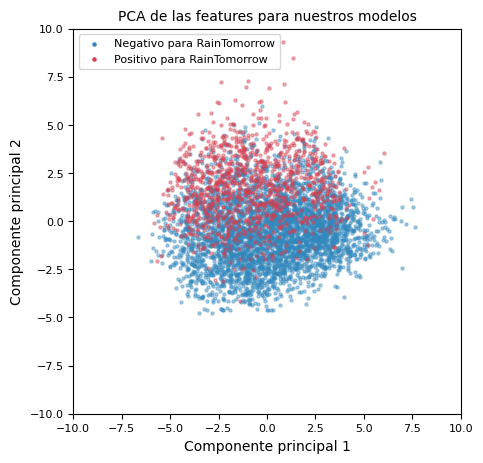

In [ ]:
# Plot subsample
random.seed(42)
subsample_size = 5000
subsample_indices = random.sample(range(len(y)), subsample_size)

X_subsample = X_pca[subsample_indices]
y_subsample = y[subsample_indices]

plt.figure(figsize=(5, 5))

plt.scatter(
    X_subsample[y_subsample == 0, 0],
    X_subsample[y_subsample == 0, 1],
    c=spectral_palette[9],
    label="Negativo para RainTomorrow",
    s=5,
    alpha=0.4,
)

plt.scatter(
    X_subsample[y_subsample == 1, 0],
    X_subsample[y_subsample == 1, 1],
    c=spectral_palette[1],
    label="Positivo para RainTomorrow",
    s=5,
    alpha=0.4
)

x_min, x_max = -10, 10
y_min, y_max = -10, 10

plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.title('PCA de las features para nuestros modelos', fontsize=10)

# Set alpha=1 for the legend only
legend = plt.legend(prop={'size': 8})
for lh in legend.legend_handles:
    lh.set_alpha(1)

plt.show()

_Podemos observar que las dos componentes principales no son suficientes para esbozar una separación entre las clases de la variable objetivo. Sin embargo, podemos ver que efectivamente ambas clases se agrupan en respectivos clusters aunque estos se encuentren solapados. El reconocimiento de estos clusters sugiere que las variables elegidas poseen cierta habilidad para distinguir entre clases._

Vamos a analizar ahora la composición del componente principal 1 obtenido.

In [ ]:
# Get the loadings for the first principal component
loadings = pca.components_[0]
pc1_loadings = pd.DataFrame(loadings, index=X.columns, columns=['PC1 Loading'])

# Get the explained variance ratio to understand how much variance each component explains
explained_variance = pca.explained_variance_ratio_

# Print loadings for the first principal component
print("Explained Variance by PC1:", explained_variance[0], "\n")
print(pc1_loadings.sort_values(by='PC1 Loading', ascending=False).head(10))

Explained Variance by PC1: 0.2385437214392498 

                PC1 Loading
MaxTemp            0.370893
Temp3pm            0.368919
Temp9am            0.346959
Evaporation        0.294211
MinTemp            0.285750
DayCos             0.236268
Sunshine           0.225360
Lat                0.205616
WindDir9amCos      0.146383
WindGustDirCos     0.127680


_Analizar la composición de los componentes principales puede resultar útil para entender el aporte de cada una de las variables de entrada a la varianza del dataset. Sin embargo, en este caso, el componente principal 1 explica sólo el 24% de la varianza total por lo que el análisis resulta insuficiente para entender el aporte de las features a la estructura del dataset._

Para realizar una evaluación más precisa de la importancia de las variables del dataset en la tarea de predecir lluvia para el día siguiente, entrenamos un modelo de random forest y extraemos del mismo la contribución de cada una de las variables a la reducción de la impureza Gini. Para el entrenamiento del modelo no se dividirán los datos en entrenamiento y testeo, ya que no nos interesa utilizarlo para realizar inferencias.

In [ ]:
# Check importance of each feature.
rf_importance = RandomForestClassifier(random_state=42)
rf_importance.fit(X, y)

feature_importances = rf_importance.feature_importances_
rf_feature_importances = pd.DataFrame(feature_importances, index=X.columns, columns=['Feature Importance'])

print(rf_feature_importances.sort_values(by='Feature Importance', ascending=False))

                Feature Importance
Humidity3pm               0.157470
Sunshine                  0.090496
Cloud3pm                  0.057866
Pressure3pm               0.056065
Pressure9am               0.049366
WindGustSpeed             0.047907
Rainfall                  0.043912
Humidity9am               0.037373
DaySin                    0.034116
Temp3pm                   0.033433
DayCos                    0.032932
MinTemp                   0.032653
MaxTemp                   0.031686
Temp9am                   0.031268
Evaporation               0.029212
Lon                       0.026764
WindSpeed3pm              0.024215
WindSpeed9am              0.023522
Cloud9am                  0.023487
Lat                       0.020978
WindDir3pmSin             0.019084
WindDir9amSin             0.017756
WindGustDirSin            0.017044
WindDir9amCos             0.015812
WindGustDirCos            0.015410
WindDir3pmCos             0.015100
RainToday                 0.015076


_Todas las variables oscilan en un rango de importancia comprendida entre 0.16 y 0.015, teniendo la mayoría de ellas valores cercanos al umbral mínimo mencionado._

_El análisis nos permite distinguir dos cuestiones de importancia:_

_En primer lugar que no encontramos variables con una importancia ínfima que sugiera su descarte, es decir, en mayor o menor medida todas las features resultan informativas para la tarea que llevamos a cabo._

_En segundo lugar, la medida de Humidity3pm y de Sunshine se destacan por su importancia relevada respecto al resto de las variables. Esta situación verifica nuestra hipótesis de la importancia de ambas variables cuando analizamos el pairplot entre todas las variables numéricas._

<!-- Normalization -->

### 2.3. Ingeniería de modelos de aprendizaje automático (ML Model Engineering)

> Debería tener en cuenta los siguientes puntos:
> - Modelado
>     - Literature reserch on similar problems (models baselines)
>     - Define quality measures of the model
>         - Besides a performance metric, also soft measures such as:
>             - Robustness
>             - Explainability
>             - Scalability
>             - Resource demand
>             - Model compexity
>         - Additionallly: model's fairness or trust
>     - Model selection (https://en.wikipedia.org/wiki/Outline_of_machine_learning#Machine_learning_methods)
>     - Incorporate domain knowledge (comparing vs baseline or domain knowledge)
>         - Beware of false bias
>     - Model training
>         - Learining problem: objetive, optimizer, regularization and cross-validation
        > - Specify model metadata (algorithm, training, validation, data testing, hipper-parameters, pre-conditions, model assumptions, environment)
>         - Model asumptions
>     - Using unlabeled data and pre-trained models (transfer learning?)
>     - Model compresion (Model optimization)
>     - Ensemble methods (boosting, baging, mixture of experts)
>     - Add model to pipeline
> - Assure reproducibility
>     - Method reproducibility
>     - Result reproducibility
>     - Experimental documentation

#### 2.3.1. Modelado

##### 2.3.1.1 Estudio de la literatura y modelo base

A modo de baseline inicial para nuestro trabajo realizamos un modelo simple que predice lluvia para el día siguiente si el día de la observación también llovió, y evaluamos los resultados obtenidos.

In [ ]:
filt = (df["RainToday"].isna()) | (df["RainTomorrow"].isna())

evaluate_predictions(df.loc[~filt, "RainTomorrow"], df.loc[~filt, "RainToday"])

In [ ]:
confusion_matrix = pd.crosstab(df["RainToday"], df["RainTomorrow"])
phi, p = phi_coefficient(confusion_matrix)

print(f"Phi Coefficient: {phi}")
print(f"p-value: {p}")

<p><em>
Observamos que el valor de accuracy se encuentra inflado por el desbalanceo en el dataset. De hecho, si predijeramos siempre ausencia de lluvia obtendríamos un valor de 0.78 en esa métrica. Claro que en ese caso obtendríamos un valor de 0 para precision y recall.

Con este modelo inicial planteado obtenemos un F1 score de 0.47, con valores para precision y recall muy similares.

Calculando el coeficiente Phi entre ambas variables binarias encontramos un valor de 0.3 (asociación entre variables moderada y positiva) con una significancia que nos permite rechazar la hipóteses de que la asociación encontrada puede deberse simplemente a la variabilidad de el muestreo aleatorio.</em></p>

### 2.4 Evaluación de modelos de aprendizaje automático (ML Model Evaluation)

> Debería tener en cuenta los siguientes puntos:
> - Validate performance (test set)
>     - Apply data transformation production pipelines
> - Determine robustness
>     - Noisy data testing
>     - Wrong data testing
>     - Statistically estimate model's local and globarl robustness
>     - Should match model's quality attributes
> - Increase explainability for ML practitioner and end user
>     - Enriching the data set
> - Compare results with defined success criteria
>     - Iterations if success criteria are not met
>     - Make a decision whether to deploy de model
>     - Document the evaluation phase
> - Recomendations
>     - Offline testing
>     - Confussion matrix
>     - Show explainability reports

### 2.5 Despliegue del modelo (Model Deployment)

> Debería tener en cuenta los siguientes puntos:
> - Define inference hardware (based on already defined requirements)
> - Model evaluation under production condition (incrementally increasing production conditions by iteratively runing the evaluation tasks)
> - Assure user acceptance and usability
>     - User guide and disclaimer
> - Minimize the risks of unforseen errors
>     - Fall-back plan (e.g. rollback to a previous version, a pre-defined baseline or a rule-base system)
> - Delpoyment strategy
>     - Incremental deployment strategy that includes a pipeline for models and data
> - Recomendations
>     - Model governance
>     - Deploy according to the selected strategy (A/B testing, multi-armed bandits)
>     - CD/CI
>     - DRP
>     - Use pre-production if available

### 2.6 Monitoreo y mantenimiento del modelo (Model Monitoring and Maintenance)

> Debería tener en cuenta los siguientes puntos:
> - Monitor
>     - Evaluate the staleness of the model (does the model has to be updated?)
> - Update
>     - New data collection plan and re-train
>     - Fine-tune model on new data
> - Recomendations
>     - Monitor the efficiency and efficacy of the model prediction serving
>     - Compare to the previously specified success criteria (thresholds)
>     - Retrain model if required
>     - Collect new data
>     - Perform labelling of the new data points
>     - Repeat tasks from the *Model Engineering* and *Model Evaluation* phases
>     - Continuous, integration, training, and deployment of the model
>     - Check model's degradation (https://en.wikipedia.org/wiki/Lehman%27s_laws_of_software_evolution and https://en.wikipedia.org/wiki/Software_rot)
>         - Non-stationary data distribution
>         - Degradation of hardware
>         - System updates
>     - Plan technical debts payment and reduction
>     - Maintenance plan and emergency plans
>     - Create alarms of all the pipeline. Include data generation differences also
>     - Plan for software substitution or destruction
>     - Do correct loging of new data

## 3. Mejora continua

> Debería tener en cuenta los siguientes puntos:
> - Fases que faltaron implementar o mejorar
> - Mejorar los procesos
> - Mejorar la documentación de los procesos

## 4. Referencias

https://en.wikipedia.org/wiki/List_of_extreme_temperatures_in_Australia
https://ml-ops.org/content/crisp-ml
https://www.researchgate.net/publication/369194767_A_Different_Traditional_Approach_for_Automatic_Comparative_Machine_Learning_in_Multimodality_Covid-19_Severity_Recognition
https://arxiv.org/pdf/2003.05155.pdf

## 5. Apendices